# Proyek Analisis Data: Air Quality Dataset
- **Nama:** Adi Suwarno
- **Email:** adwarnz@gmail.com
- **ID Dicoding:** adiasarn_suwarnoadi

In [1]:
!pip freeze > requirements.txt

## Menentukan Pertanyaan Bisnis

- What are the climate characteristics of Beijing City?
- How is the seasonal pattern of pollutant levels in Beijing?
- What is the trend in pollutant levels over the last 4 years?
- Where are the areas with the highest and lowest levels of air pollution?
- How is rainfall related to pollution levels in each region?

## Import Semua Packages/Library yang Digunakan

In [2]:
import os
import numpy as np
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import seaborn as sns
import statistics
import streamlit as st

from babel.numbers import format_currency
from shapely.geometry import Point

## Data Wrangling

### Gathering Data

#### Upload Dataset Air Quality

In [2]:
dire = "Air-quality-dataset"
files = os.listdir(dire)
for file in files:
    print(file)

PRSA_Data_Aotizhongxin_20130301-20170228.csv
PRSA_Data_Changping_20130301-20170228.csv
PRSA_Data_Dingling_20130301-20170228.csv
PRSA_Data_Dongsi_20130301-20170228.csv
PRSA_Data_Guanyuan_20130301-20170228.csv
PRSA_Data_Gucheng_20130301-20170228.csv
PRSA_Data_Huairou_20130301-20170228.csv
PRSA_Data_Nongzhanguan_20130301-20170228.csv
PRSA_Data_Shunyi_20130301-20170228.csv
PRSA_Data_Tiantan_20130301-20170228.csv
PRSA_Data_Wanliu_20130301-20170228.csv
PRSA_Data_Wanshouxigong_20130301-20170228.csv


In [3]:
all_data = []
for file in files:
    data = pd.read_csv(f'Air-quality-dataset/{file}')
    data2 = pd.DataFrame(data)
    all_data.append(data2)
all_data

[          No  year  month  day  hour  PM2.5  PM10   SO2   NO2     CO    O3  \
 0          1  2013      3    1     0    4.0   4.0   4.0   7.0  300.0  77.0   
 1          2  2013      3    1     1    8.0   8.0   4.0   7.0  300.0  77.0   
 2          3  2013      3    1     2    7.0   7.0   5.0  10.0  300.0  73.0   
 3          4  2013      3    1     3    6.0   6.0  11.0  11.0  300.0  72.0   
 4          5  2013      3    1     4    3.0   3.0  12.0  12.0  300.0  72.0   
 ...      ...   ...    ...  ...   ...    ...   ...   ...   ...    ...   ...   
 35059  35060  2017      2   28    19   12.0  29.0   5.0  35.0  400.0  95.0   
 35060  35061  2017      2   28    20   13.0  37.0   7.0  45.0  500.0  81.0   
 35061  35062  2017      2   28    21   16.0  37.0  10.0  66.0  700.0  58.0   
 35062  35063  2017      2   28    22   21.0  44.0  12.0  87.0  700.0  35.0   
 35063  35064  2017      2   28    23   19.0  31.0  10.0  79.0  600.0  42.0   
 
        TEMP    PRES  DEWP  RAIN   wd  WSPM       

In [5]:
i = 1
while i < len(all_data):
    if (i == 1):
        air_qi = pd.concat([all_data[0], all_data[1]], axis=0)
    else:
        air_qi = pd.concat([air_qi, all_data[i]], axis=0)
    i += 1
air_qi

,No,year,month,day,hour,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,wd,WSPM,station
0,1,2013,3,1,0,4.0,4.0,4.0,7.0,300.0,77.0,-0.7,1023.0,-18.8,0.0,NNW,4.4,Aotizhongxin
1,2,2013,3,1,1,8.0,8.0,4.0,7.0,300.0,77.0,-1.1,1023.2,-18.2,0.0,N,4.7,Aotizhongxin
2,3,2013,3,1,2,7.0,7.0,5.0,10.0,300.0,73.0,-1.1,1023.5,-18.2,0.0,NNW,5.6,Aotizhongxin
3,4,2013,3,1,3,6.0,6.0,11.0,11.0,300.0,72.0,-1.4,1024.5,-19.4,0.0,NW,3.1,Aotizhongxin
4,5,2013,3,1,4,3.0,3.0,12.0,12.0,300.0,72.0,-2.0,1025.2,-19.5,0.0,N,2.0,Aotizhongxin
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
35059,35060,2017,2,28,19,11.0,32.0,3.0,24.0,400.0,72.0,12.5,1013.5,-16.2,0.0,NW,2.4,Wanshouxigong
35060,35061,2017,2,28,20,13.0,32.0,3.0,41.0,500.0,50.0,11.6,1013.6,-15.1,0.0,WNW,0.9,Wanshouxigong
35061,35062,2017,2,28,21,14.0,28.0,4.0,38.0,500.0,54.0,10.8,1014.2,-13.3,0.0,NW,1.1,Wanshouxigong
35062,35063,2017,2,28,22,12.0,23.0,4.0,30.0,400.0,59.0,10.5,1014.4,-12.9,0.0,NNW,1.2,Wanshouxigong


In [7]:
air_qi.info()

<class 'pandas.core.frame.DataFrame'>
Index: 420768 entries, 0 to 35063
Data columns (total 18 columns):
 #   Column   Non-Null Count   Dtype  
---  ------   --------------   -----  
 0   No       420768 non-null  int64  
 1   year     420768 non-null  int64  
 2   month    420768 non-null  int64  
 3   day      420768 non-null  int64  
 4   hour     420768 non-null  int64  
 5   PM2.5    412029 non-null  float64
 6   PM10     414319 non-null  float64
 7   SO2      411747 non-null  float64
 8   NO2      408652 non-null  float64
 9   CO       400067 non-null  float64
 10  O3       407491 non-null  float64
 11  TEMP     420370 non-null  float64
 12  PRES     420375 non-null  float64
 13  DEWP     420365 non-null  float64
 14  RAIN     420378 non-null  float64
 15  wd       418946 non-null  object 
 16  WSPM     420450 non-null  float64
 17  station  420768 non-null  object 
dtypes: float64(11), int64(5), object(2)
memory usage: 61.0+ MB


In [8]:
air_qi['station'].unique()

array(['Aotizhongxin', 'Changping', 'Dingling', 'Dongsi', 'Guanyuan',
       'Gucheng', 'Huairou', 'Nongzhanguan', 'Shunyi', 'Tiantan',
       'Wanliu', 'Wanshouxigong'], dtype=object)

In [9]:
air_qi['station'].unique().__len__() == len(all_data)

True

In [10]:
air_qi['date'] = pd.to_datetime(air_qi[['year','month','day']])
air_qi['date_h'] = pd.to_datetime(air_qi[['year','month','day','hour']])
air_qi = air_qi.iloc[:,1:]
air_qi.head()

,year,month,day,hour,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,wd,WSPM,station,date,date_h
0,2013,3,1,0,4.0,4.0,4.0,7.0,300.0,77.0,-0.7,1023.0,-18.8,0.0,NNW,4.4,Aotizhongxin,2013-03-01,2013-03-01 00:00:00
1,2013,3,1,1,8.0,8.0,4.0,7.0,300.0,77.0,-1.1,1023.2,-18.2,0.0,N,4.7,Aotizhongxin,2013-03-01,2013-03-01 01:00:00
2,2013,3,1,2,7.0,7.0,5.0,10.0,300.0,73.0,-1.1,1023.5,-18.2,0.0,NNW,5.6,Aotizhongxin,2013-03-01,2013-03-01 02:00:00
3,2013,3,1,3,6.0,6.0,11.0,11.0,300.0,72.0,-1.4,1024.5,-19.4,0.0,NW,3.1,Aotizhongxin,2013-03-01,2013-03-01 03:00:00
4,2013,3,1,4,3.0,3.0,12.0,12.0,300.0,72.0,-2.0,1025.2,-19.5,0.0,N,2.0,Aotizhongxin,2013-03-01,2013-03-01 04:00:00


In [11]:
air_qi.columns

Index(['year', 'month', 'day', 'hour', 'PM2.5', 'PM10', 'SO2', 'NO2', 'CO',
       'O3', 'TEMP', 'PRES', 'DEWP', 'RAIN', 'wd', 'WSPM', 'station', 'date',
       'date_h'],
      dtype='object')

In [12]:
new_col = ['date_h', 'PM2.5', 'PM10', 'SO2', 
           'NO2', 'CO', 'O3', 'TEMP', 'PRES', 'DEWP', 'RAIN', 'wd', 'WSPM', 
           'station', 'date', 'year', 'month', 'day', 'hour']
air_qi = air_qi.reindex(columns=new_col)
air_qi.head()

,date_h,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,wd,WSPM,station,date,year,month,day,hour
0,2013-03-01 00:00:00,4.0,4.0,4.0,7.0,300.0,77.0,-0.7,1023.0,-18.8,0.0,NNW,4.4,Aotizhongxin,2013-03-01,2013,3,1,0
1,2013-03-01 01:00:00,8.0,8.0,4.0,7.0,300.0,77.0,-1.1,1023.2,-18.2,0.0,N,4.7,Aotizhongxin,2013-03-01,2013,3,1,1
2,2013-03-01 02:00:00,7.0,7.0,5.0,10.0,300.0,73.0,-1.1,1023.5,-18.2,0.0,NNW,5.6,Aotizhongxin,2013-03-01,2013,3,1,2
3,2013-03-01 03:00:00,6.0,6.0,11.0,11.0,300.0,72.0,-1.4,1024.5,-19.4,0.0,NW,3.1,Aotizhongxin,2013-03-01,2013,3,1,3
4,2013-03-01 04:00:00,3.0,3.0,12.0,12.0,300.0,72.0,-2.0,1025.2,-19.5,0.0,N,2.0,Aotizhongxin,2013-03-01,2013,3,1,4


In [13]:
new_col = ['date_h', 'PM2_5', 'PM10', 'SO2', 
           'NO2', 'CO', 'O3', 'TEMP', 'PRES', 'DEWP', 'RAIN', 'wd', 'WSPM', 
           'station', 'date', 'year', 'month', 'day', 'hour']
air_qi.columns = new_col
air_qi.head()

,date_h,PM2_5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,wd,WSPM,station,date,year,month,day,hour
0,2013-03-01 00:00:00,4.0,4.0,4.0,7.0,300.0,77.0,-0.7,1023.0,-18.8,0.0,NNW,4.4,Aotizhongxin,2013-03-01,2013,3,1,0
1,2013-03-01 01:00:00,8.0,8.0,4.0,7.0,300.0,77.0,-1.1,1023.2,-18.2,0.0,N,4.7,Aotizhongxin,2013-03-01,2013,3,1,1
2,2013-03-01 02:00:00,7.0,7.0,5.0,10.0,300.0,73.0,-1.1,1023.5,-18.2,0.0,NNW,5.6,Aotizhongxin,2013-03-01,2013,3,1,2
3,2013-03-01 03:00:00,6.0,6.0,11.0,11.0,300.0,72.0,-1.4,1024.5,-19.4,0.0,NW,3.1,Aotizhongxin,2013-03-01,2013,3,1,3
4,2013-03-01 04:00:00,3.0,3.0,12.0,12.0,300.0,72.0,-2.0,1025.2,-19.5,0.0,N,2.0,Aotizhongxin,2013-03-01,2013,3,1,4


#### Upload Dataset Station Location

In [14]:
locsta = pd.read_excel('lonlat_sta.xlsx')
locsta.head()

,station,location,lon,lat,elevation
0,Dongsi,Dongcheng District Environmental Protection Bu...,116.417,39.929,31
1,Tiantan,Inside Temple of Heaven Park (Park in urban),116.407,39.886,33
2,Guanyuan,Beijing Municipal Party School (School in urban),116.339,39.929,47
3,Wanshouxigong,Inside Wanshou Park (Park in urban),116.352,39.878,51
4,Aotizhongxin,Inside Olympic Center (Sports Center in urban),116.397,39.982,42


#### Merge AQ and Station Location Dataset

In [15]:
air_qi = pd.merge(
    left=air_qi,
    right=locsta,
    how='left',
    left_on='station',
    right_on='station'
)

,date_h,PM2_5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,...,station,date,year,month,day,hour,location,lon,lat,elevation
0,2013-03-01 00:00:00,4.0,4.0,4.0,7.0,300.0,77.0,-0.7,1023.0,-18.8,...,Aotizhongxin,2013-03-01,2013,3,1,0,Inside Olympic Center (Sports Center in urban),116.397,39.982,42
1,2013-03-01 01:00:00,8.0,8.0,4.0,7.0,300.0,77.0,-1.1,1023.2,-18.2,...,Aotizhongxin,2013-03-01,2013,3,1,1,Inside Olympic Center (Sports Center in urban),116.397,39.982,42
2,2013-03-01 02:00:00,7.0,7.0,5.0,10.0,300.0,73.0,-1.1,1023.5,-18.2,...,Aotizhongxin,2013-03-01,2013,3,1,2,Inside Olympic Center (Sports Center in urban),116.397,39.982,42
3,2013-03-01 03:00:00,6.0,6.0,11.0,11.0,300.0,72.0,-1.4,1024.5,-19.4,...,Aotizhongxin,2013-03-01,2013,3,1,3,Inside Olympic Center (Sports Center in urban),116.397,39.982,42
4,2013-03-01 04:00:00,3.0,3.0,12.0,12.0,300.0,72.0,-2.0,1025.2,-19.5,...,Aotizhongxin,2013-03-01,2013,3,1,4,Inside Olympic Center (Sports Center in urban),116.397,39.982,42
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
420763,2017-02-28 19:00:00,11.0,32.0,3.0,24.0,400.0,72.0,12.5,1013.5,-16.2,...,Wanshouxigong,2017-02-28,2017,2,28,19,Inside Wanshou Park (Park in urban),116.352,39.878,51
420764,2017-02-28 20:00:00,13.0,32.0,3.0,41.0,500.0,50.0,11.6,1013.6,-15.1,...,Wanshouxigong,2017-02-28,2017,2,28,20,Inside Wanshou Park (Park in urban),116.352,39.878,51
420765,2017-02-28 21:00:00,14.0,28.0,4.0,38.0,500.0,54.0,10.8,1014.2,-13.3,...,Wanshouxigong,2017-02-28,2017,2,28,21,Inside Wanshou Park (Park in urban),116.352,39.878,51
420766,2017-02-28 22:00:00,12.0,23.0,4.0,30.0,400.0,59.0,10.5,1014.4,-12.9,...,Wanshouxigong,2017-02-28,2017,2,28,22,Inside Wanshou Park (Park in urban),116.352,39.878,51


#### Upload Shapefile

In [69]:
shp_chn = gpd.read_file('gadm41_CHN_shp/gadm41_CHN_3.shp')
shp_beijing = shp_chn[shp_chn['NAME_2']=='Beijing']
shp_beijing

,GID_3,GID_0,COUNTRY,GID_1,NAME_1,NL_NAME_1,GID_2,NAME_2,NL_NAME_2,NAME_3,VARNAME_3,NL_NAME_3,TYPE_3,ENGTYPE_3,CC_3,HASC_3,geometry
77,CHN.2.1.1_1,CHN,China,CHN.2_1,Beijing,北京|北京,CHN.2.1_1,Beijing,北京|北京,Beijing,Běijīng,北京|北京,Zhíxiáshì,Municipality,NA,NA,"POLYGON ((116.04115 40.09016, 116.04356 40.093..."
78,CHN.2.1.2_1,CHN,China,CHN.2_1,Beijing,北京|北京,CHN.2.1_1,Beijing,北京|北京,Changping,Chāngpíng,昌平区,Shìxiáqū,District,NA,NA,"POLYGON ((116.46198 40.09152, 116.45969 40.088..."
79,CHN.2.1.3_1,CHN,China,CHN.2_1,Beijing,北京|北京,CHN.2.1_1,Beijing,北京|北京,Daxing,Dàxīng,大兴区,Shìxiáqū,District,NA,NA,"POLYGON ((116.24221 39.79697, 116.24181 39.801..."
80,CHN.2.1.4_1,CHN,China,CHN.2_1,Beijing,北京|北京,CHN.2.1_1,Beijing,北京|北京,Fangshan,Fángshān,房山区,Shìxiáqū,District,NA,NA,"POLYGON ((116.06849 39.85844, 116.07230 39.838..."
81,CHN.2.1.5_1,CHN,China,CHN.2_1,Beijing,北京|北京,CHN.2.1_1,Beijing,北京|北京,Huairou,Huáiróu,怀柔区,Shìxiáqū,District,NA,NA,"POLYGON ((116.49032 40.25365, 116.48671 40.255..."
82,CHN.2.1.6_1,CHN,China,CHN.2_1,Beijing,北京|北京,CHN.2.1_1,Beijing,北京|北京,Mentougou,Méntóugōu,门头沟区,Shìxiáqū,District,NA,NA,"POLYGON ((116.04115 40.09016, 116.04833 40.075..."
83,CHN.2.1.7_1,CHN,China,CHN.2_1,Beijing,北京|北京,CHN.2.1_1,Beijing,北京|北京,Miyun,Mìyún,密云县,Xiàn,County,NA,NA,"POLYGON ((116.73690 40.28104, 116.73747 40.283..."
84,CHN.2.1.8_1,CHN,China,CHN.2_1,Beijing,北京|北京,CHN.2.1_1,Beijing,北京|北京,Pinggu,Pínggǔ,平谷区,Shìxiáqū,District,NA,NA,"POLYGON ((116.92149 40.22206, 116.92368 40.225..."
85,CHN.2.1.9_1,CHN,China,CHN.2_1,Beijing,北京|北京,CHN.2.1_1,Beijing,北京|北京,Shunyi,Shùnyì,顺义区,Shìxiáqū,District,NA,NA,"POLYGON ((116.59245 40.02933, 116.57736 40.035..."
86,CHN.2.1.10_1,CHN,China,CHN.2_1,Beijing,北京|北京,CHN.2.1_1,Beijing,北京|北京,Tongzhou,Tōngzhōu,通州区,Shìxiáqū,District,NA,NA,"POLYGON ((116.53358 39.82344, 116.55157 39.818..."


<Axes: >

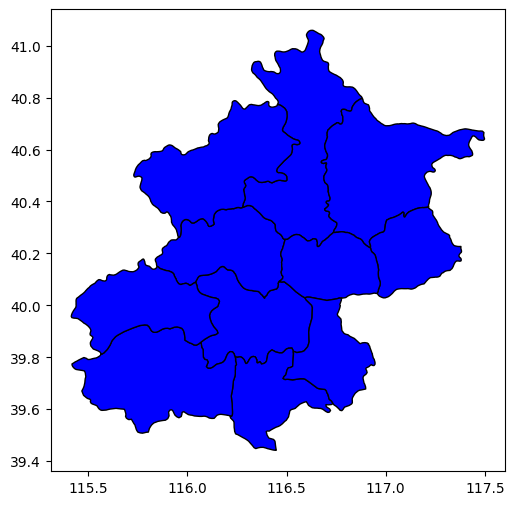

In [70]:
fig, ax = plt.subplots(figsize=(10, 6))  # Adjust figure size as needed

# Plot the geodataframe (or filtered data)
shp_beijing.plot(ax=ax, color='blue', edgecolor='black')

### Assessing Data

In [16]:
air_qi.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 420768 entries, 0 to 420767
Data columns (total 23 columns):
 #   Column     Non-Null Count   Dtype         
---  ------     --------------   -----         
 0   date_h     420768 non-null  datetime64[ns]
 1   PM2_5      412029 non-null  float64       
 2   PM10       414319 non-null  float64       
 3   SO2        411747 non-null  float64       
 4   NO2        408652 non-null  float64       
 5   CO         400067 non-null  float64       
 6   O3         407491 non-null  float64       
 7   TEMP       420370 non-null  float64       
 8   PRES       420375 non-null  float64       
 9   DEWP       420365 non-null  float64       
 10  RAIN       420378 non-null  float64       
 11  wd         418946 non-null  object        
 12  WSPM       420450 non-null  float64       
 13  station    420768 non-null  object        
 14  date       420768 non-null  datetime64[ns]
 15  year       420768 non-null  int64         
 16  month      420768 no

In [17]:
air_qi.isna().sum()

date_h           0
PM2_5         8739
PM10          6449
SO2           9021
NO2          12116
CO           20701
O3           13277
TEMP           398
PRES           393
DEWP           403
RAIN           390
wd            1822
WSPM           318
station          0
date             0
year             0
month            0
day              0
hour             0
location         0
lon              0
lat              0
elevation        0
dtype: int64

In [18]:
air_qi.duplicated().sum()

0

In [19]:
air_qi.groupby('date').agg('count')

,date_h,PM2_5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,...,WSPM,station,year,month,day,hour,location,lon,lat,elevation
date,,,,,,,,,,,,,,,,,,,,,
2013-03-01,288,288,286,282,244,282,282,288,288,288,...,288,288,288,288,288,288,288,288,288,288
2013-03-02,288,288,287,284,283,283,287,288,288,288,...,288,288,288,288,288,288,288,288,288,288
2013-03-03,288,288,288,287,280,287,288,288,288,288,...,288,288,288,288,288,288,288,288,288,288
2013-03-04,288,283,286,287,269,286,288,288,288,288,...,288,288,288,288,288,288,288,288,288,288
2013-03-05,288,271,288,282,269,280,288,288,288,288,...,288,288,288,288,288,288,288,288,288,288
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017-02-24,288,286,286,286,280,286,283,288,288,288,...,288,288,288,288,288,288,288,288,288,288
2017-02-25,288,283,283,283,283,283,283,288,288,288,...,288,288,288,288,288,288,288,288,288,288
2017-02-26,288,285,285,285,285,285,283,288,288,288,...,288,288,288,288,288,288,288,288,288,288


### Cleaning Data

Diketahui bahwa data kosong berada pada variabel-variabel beserta jumlahnya sebagai berikut:
- PM2.5 : 8739
- PM10 : 6449
- SO2 : 9021
- NO2 : 12116
- CO : 20701
- O3 : 13277
- TEMP : 398
- PRES : 393
- DEWP : 403
- RAIN : 390
- wd : 1822
- WSPM : 318

Data PM2.5, PM10, SO2, NO2, CO, O3, Temp, Pres, Dewp, dan WSPM akan diisi dengan nilai interpolasi. Data rain akan diisi dengan memerhatikan aspek lain atau akan dihapus. Data wd akan diisi dengan nilai modusnya. **Namun, perlu diperhatikan bahwa penginputan harus memerhatikan aspek lokasi dan waktu. Sebab, data ini merupakan data time series tingkat jam.**



#### Data Imputation for Missing Value on PM2.5, PM10, SO2, NO2, CO, O3, Temp, Pres, Dewp, dan WSPM

In [20]:
stations = air_qi['station'].unique()
hours = air_qi['hour'].unique()

In [21]:
variabel = ['PM2_5', 'PM10', 'SO2', 'NO2', 'CO', 'O3', 'TEMP', 'PRES', 'DEWP', 'WSPM']

In [22]:
def imputation_mean(data, variables, stations, hours):
    ''' 
    A function of filling the values of missing values with its average.
    Imputation was did in some variabels or features depending on the station and recording time.
    
    Args:
        data (pd.DataFrame): The DataFrame containing missing values.
        variables (list): A list of variable names (column names) to impute.
        stations (list): A list of station observations.
        hours (list): A list of time measurements.

    Returns:
        pd.DataFrame: The DataFrame with missing values filled by mean for specified conditions.
    '''
    for variable in variables:
        for station in stations:
            for hour in hours:
                data[variable][(data['station'] == station) &
                                 (data['hour'] == hour)] = data[(data['station'] == station) &
                                                                    (data['hour'] == hour)][variable].fillna(
                                                                        value=data[(data['station'] == station) &
                                                                                     (data['hour'] == hour)][variable].mean())
    return data

In [23]:
imputation_mean(air_qi, variables=variabel, stations=stations, hours=hours)
air_qi.isna().sum()

C:\Users\ACER\AppData\Local\Temp\ipykernel_17932\2598602046.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[variable][(data['station'] == station) &
C:\Users\ACER\AppData\Local\Temp\ipykernel_17932\2598602046.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[variable][(data['station'] == station) &
C:\Users\ACER\AppData\Local\Temp\ipykernel_17932\2598602046.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[var

date_h          0
PM2_5           0
PM10            0
SO2             0
NO2             0
CO              0
O3              0
TEMP            0
PRES            0
DEWP            0
RAIN          390
wd           1822
WSPM            0
station         0
date            0
year            0
month           0
day             0
hour            0
location        0
lon             0
lat             0
elevation       0
dtype: int64

In [24]:
# air_qi.to_csv('air_qi_fillna_mean.csv')
# air_qi = pd.read_csv('air_qi_fillna_mean.csv')

#### Data Imputation for Missing Value on wd

In [25]:
variabel = ['wd']

In [26]:
def imputation_modus(data, variables, stations, hours):
    ''' 
    A function of filling the values of missing values with its mode.
    Imputation was did in some variabels or features depending on the station and recording time.
    
    Args:
        data (pd.DataFrame): The DataFrame containing missing values.
        variables (list): A list of variable names (column names) to impute.
        stations (list): A list of station observations.
        hours (list): A list of time measurements.

    Returns:
        pd.DataFrame: The DataFrame with missing values filled by mode for specified conditions.
    '''
    for variable in variables:
        for station in stations:
            for hour in hours:
                modus = statistics.mode(data[variable][(data['station'] == station) & (data['hour'] == hour)])
                data[variable][(data['station'] == station) &
                                 (data['hour'] == hour)] = data[(data['station'] == station) &
                                                                    (data['hour'] == hour)][variable].fillna(
                                                                        value=modus)
    return data

In [27]:
imputation_modus(air_qi, variables=variabel, stations=stations, hours=hours)
air_qi.isna().sum()

C:\Users\ACER\AppData\Local\Temp\ipykernel_17932\1125747100.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[variable][(data['station'] == station) &
C:\Users\ACER\AppData\Local\Temp\ipykernel_17932\1125747100.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[variable][(data['station'] == station) &


C:\Users\ACER\AppData\Local\Temp\ipykernel_17932\1125747100.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[variable][(data['station'] == station) &
C:\Users\ACER\AppData\Local\Temp\ipykernel_17932\1125747100.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[variable][(data['station'] == station) &
C:\Users\ACER\AppData\Local\Temp\ipykernel_17932\1125747100.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[var

date_h         0
PM2_5          0
PM10           0
SO2            0
NO2            0
CO             0
O3             0
TEMP           0
PRES           0
DEWP           0
RAIN         390
wd             0
WSPM           0
station        0
date           0
year           0
month          0
day            0
hour           0
location       0
lon            0
lat            0
elevation      0
dtype: int64

In [71]:
# air_qi.to_csv('air_qi_fillna_mean_mode.csv')
# air_qi = pd.read_csv('air_qi_fillna_mean_mode.csv')

#### Data Imputation for Missing Value on RAIN

In [29]:
air_qi[['date','RAIN','station']].groupby('station').agg('count')

,date,RAIN
station,,
Aotizhongxin,35064,35044
Changping,35064,35013
Dingling,35064,35013
Dongsi,35064,35044
Guanyuan,35064,35044
Gucheng,35064,35021
Huairou,35064,35009
Nongzhanguan,35064,35044
Shunyi,35064,35013


Keterbatasan pengetahuan terkait imputasi data presipitasi (RAIN) untuk dataset tersebut, maka akan dipilih penghapusan row dengan baris data kosong. Jumlahnya yang kecil dan hampir merata di setiap stasiun diharapkan tidak akan begitu berdampak ke depannya.

In [30]:
variabel = ['RAIN']

In [31]:
def imputation_drop(data, variables, stations, hours):
    ''' 
    A function of filling the values of missing values by removing it.
    Imputation was did in some variables or features depending on the station and recording time.
    
    Args:
        data (pd.DataFrame): The DataFrame containing missing values.
        variables (list): A list of variable names (column names) to impute.
        stations (list): A list of station observations.
        hours (list): A list of time measurements.

    Returns:
        pd.DataFrame: The DataFrame with missing values dropped for specified conditions.
    '''
    for variable in variables:
        for station in stations:
            for hour in hours:
                data[variable][(data['station'] == station) &
                               (data['hour'] == hour)] = data[variable][(data['station'] == station) &
                                                                        (data['hour'] == hour)].fillna(value=9999, axis=0)
        data = data[data[variable] != 9999]
    return data

Namun, pada kali ini, data kosong pada variabel RAIN akan dibiarkan.

In [32]:
# air_qi.to_csv('air_qi_clean.csv')
# air_qi = pd.read_csv('air_qi_clean.csv')

## Exploratory Data Analysis (EDA)

In [125]:
stations = air_qi['station'].unique()
def filter_sta(data, col, stations, listSta):
    '''
    A function to filter data by a station. Each data is saved to list.

    Args:
        data (pd.DataFrame): The DataFrame.
        col (chr): the name of station column in data.
        stations (list): A list of station observations.
        listSta (list): An empty list.

    Returns:
        list : list of filtered data (in pd.Dataframe) by station.
    '''

    for station in stations:
        filterData = data[data[col]==station]
        filteredData = pd.DataFrame(filterData)
        listSta.append(filteredData)
    return listSta

### Eksplorasi Data Harian

In [106]:
air_qi_daily = air_qi.groupby(['station','date']).agg({
    'PM2_5' : 'mean',
    'PM10' : 'mean',
    'SO2' : 'mean',
    'NO2' : 'mean',
    'CO' : 'mean',
    'O3' : 'mean',
    'TEMP' : 'mean',
    'PRES' : 'mean',
    'DEWP' : 'mean',
    'RAIN' : 'sum',
    'WSPM' : 'mean',
    'wd' : statistics.mode,
})
air_qi_daily.reset_index(inplace=True)
air_qi_daily.head()

,station,date,PM2_5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,WSPM,wd
0,Aotizhongxin,2013-03-01,7.125000,10.750000,11.708333,22.583333,429.166667,63.875000,1.391667,1026.875000,-18.745833,0.0,3.254167,NNW
1,Aotizhongxin,2013-03-02,30.750000,42.083333,36.625000,66.666667,824.916667,29.750000,0.616667,1026.850000,-15.937500,0.0,1.479167,NNE
2,Aotizhongxin,2013-03-03,76.916667,120.541667,61.291667,81.000000,1620.625000,19.125000,5.566667,1014.608333,-12.316667,0.0,1.658333,NNE
3,Aotizhongxin,2013-03-04,22.708333,44.583333,22.638921,47.682072,648.187469,53.750000,9.962500,1017.650000,-11.683333,0.0,2.404167,N
4,Aotizhongxin,2013-03-05,148.875000,183.791667,93.875000,132.833333,2357.958333,68.458333,6.291667,1010.900000,-7.525000,0.0,1.129167,NE


In [107]:
air_qi_daily.describe()

,date,PM2_5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,WSPM
count,17532,17532.000000,17532.000000,17532.000000,17532.000000,17532.000000,17532.000000,17532.000000,17532.000000,17532.000000,17532.000000,17532.000000
mean,2015-02-28 23:59:59.999999744,79.764757,104.566131,15.823383,50.554229,1230.359559,57.210009,13.539211,1010.746264,2.490617,1.545984,1.729727
min,2013-03-01 00:00:00,3.000000,4.833333,1.000000,2.000000,100.000000,1.000000,-15.683333,985.787500,-33.020833,0.000000,0.170833
25%,2014-03-01 00:00:00,31.208333,49.791667,4.083333,30.922467,637.500000,26.982265,3.037500,1002.329167,-9.187500,0.000000,1.195833
50%,2015-03-01 00:00:00,61.291667,87.945497,9.181612,45.875000,975.000000,52.055983,15.012500,1010.518750,2.764583,0.000000,1.558333
75%,2016-02-29 00:00:00,106.708333,136.843750,20.145499,64.708333,1458.333333,80.877313,23.476042,1018.905208,14.995833,0.000000,2.058333
max,2017-02-28 00:00:00,567.416667,584.666667,156.416667,193.333333,8904.166667,504.176929,32.366667,1041.025000,27.616667,266.600000,7.237500
std,NaN,67.972790,73.397544,17.968536,27.555119,941.758230,37.913380,10.818589,10.261068,13.523566,7.955950,0.779363


In [129]:
list_aq_daily_sta = []
column_name = 'station'
filter_sta(air_qi_daily, col=column_name, stations=stations, listSta=list_aq_daily_sta)

[           station       date       PM2_5        PM10        SO2         NO2  \
 0     Aotizhongxin 2013-03-01    7.125000   10.750000  11.708333   22.583333   
 1     Aotizhongxin 2013-03-02   30.750000   42.083333  36.625000   66.666667   
 2     Aotizhongxin 2013-03-03   76.916667  120.541667  61.291667   81.000000   
 3     Aotizhongxin 2013-03-04   22.708333   44.583333  22.638921   47.682072   
 4     Aotizhongxin 2013-03-05  148.875000  183.791667  93.875000  132.833333   
 ...            ...        ...         ...         ...        ...         ...   
 1456  Aotizhongxin 2017-02-24   21.541667   32.625000  16.583333   58.875000   
 1457  Aotizhongxin 2017-02-25   11.208333   19.708333   6.750000   43.375000   
 1458  Aotizhongxin 2017-02-26   28.125000   40.708333  10.083333   65.375000   
 1459  Aotizhongxin 2017-02-27   72.500561   95.060216  18.966645   91.833748   
 1460  Aotizhongxin 2017-02-28   13.166667   23.291667   9.125000   38.291667   
 
                CO        

### Eksplorasi Data Bulanan

In [172]:
air_qi_monthly_ey = air_qi.groupby(['station','year','month']).agg({
    'PM2_5' : 'mean',
    'PM10' : 'mean',
    'SO2' : 'mean',
    'NO2' : 'mean',
    'CO' : 'mean',
    'O3' : 'mean',
    'TEMP' : 'mean',
    'PRES' : 'mean',
    'DEWP' : 'mean',
    'RAIN' : 'sum',
    'WSPM' : 'mean',
    'wd' : statistics.mode,
})
air_qi_monthly_ey.reset_index(inplace=True)
air_qi_monthly_ey['day'] = 1
air_qi_monthly_ey['date'] = pd.to_datetime(air_qi_monthly_ey[['year','month','day']])
air_qi_monthly_ey.head()

,station,year,month,PM2_5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,WSPM,wd,day,date
0,Aotizhongxin,2013,3,110.092742,143.938842,44.716872,74.751870,1468.813900,47.160735,6.053629,1012.547446,-5.729435,19.5,2.000134,NE,1,2013-03-01
1,Aotizhongxin,2013,4,62.751389,108.204167,24.709855,53.333062,929.081422,50.611435,12.260694,1008.296944,-1.553611,10.9,2.209722,SW,1,2013-04-01
2,Aotizhongxin,2013,5,84.984205,140.778226,30.442204,61.016129,969.992609,73.263836,21.374194,1003.162231,9.790457,5.8,1.740457,SW,1,2013-05-01
3,Aotizhongxin,2013,6,106.144804,128.716667,14.681299,72.790026,1322.743364,69.002195,23.386111,1000.165556,18.009028,94.1,1.240000,NE,1,2013-06-01
4,Aotizhongxin,2013,7,68.911290,85.440876,9.314356,55.156107,841.063166,71.429644,26.877419,996.033065,21.459946,218.6,1.278763,NE,1,2013-07-01


In [173]:
air_qi_monthly_ey.describe()

,year,month,PM2_5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,WSPM,day,date
count,576.000000,576.000000,576.000000,576.000000,576.000000,576.000000,576.000000,576.000000,576.000000,576.000000,576.000000,576.000000,576.000000,576.0,576
mean,2014.666667,6.500000,79.795336,104.541804,15.871482,50.542665,1230.499223,57.115726,13.478030,1010.794890,2.418805,47.055903,1.730807,1.0,2015-02-15 02:00:00
min,2013.000000,1.000000,35.344245,44.348315,2.356571,8.869639,459.757555,11.088130,-6.183468,992.801210,-18.604570,0.000000,0.601944,1.0,2013-03-01 00:00:00
25%,2014.000000,3.750000,60.077337,81.669406,6.361815,39.545828,865.546491,29.579609,2.661533,1002.417083,-9.127923,2.100000,1.468056,1.0,2014-02-22 00:00:00
50%,2015.000000,6.500000,75.526113,102.604465,11.710593,49.974450,1081.483494,53.323818,13.837030,1011.331060,4.019288,14.800000,1.698925,1.0,2015-02-15 00:00:00
75%,2016.000000,9.250000,94.982198,127.099721,21.490868,62.100128,1493.019271,82.888805,22.377941,1018.505685,14.360556,70.050000,1.997177,1.0,2016-02-08 06:00:00
max,2017.000000,12.000000,167.267076,188.105740,62.326829,110.837481,3192.769354,119.175632,28.380242,1026.777285,21.521774,373.500000,2.739224,1.0,2017-02-01 00:00:00
std,1.179536,3.455053,26.134179,29.673738,12.595812,17.147003,503.014162,29.418783,10.383246,8.962415,12.441010,65.194047,0.406361,0.0,NaN


In [180]:
list_aq_mon_year_sta = []
column_name = 'station'
filter_sta(air_qi_monthly_ey, col=column_name, stations=stations, listSta=list_aq_mon_year_sta)

[         station  year  month       PM2_5        PM10        SO2        NO2  \
 0   Aotizhongxin  2013      3  110.092742  143.938842  44.716872  74.751870   
 1   Aotizhongxin  2013      4   62.751389  108.204167  24.709855  53.333062   
 2   Aotizhongxin  2013      5   84.984205  140.778226  30.442204  61.016129   
 3   Aotizhongxin  2013      6  106.144804  128.716667  14.681299  72.790026   
 4   Aotizhongxin  2013      7   68.911290   85.440876   9.314356  55.156107   
 5   Aotizhongxin  2013      8   62.261643   84.455645   6.998354  56.984255   
 6   Aotizhongxin  2013      9   79.164534  105.092982  13.816619  64.134993   
 7   Aotizhongxin  2013     10   95.219107  120.086022  22.425482  73.611765   
 8   Aotizhongxin  2013     11   77.453267  105.633333  25.961111  59.951389   
 9   Aotizhongxin  2013     12   76.790172  106.676075  41.373882  62.265099   
 10  Aotizhongxin  2014      1   95.643620  125.633951  58.159555  67.155676   
 11  Aotizhongxin  2014      2  142.5555

### Eksplorasi Data Bulanan (Musiman)

In [175]:
air_qi_monthly = air_qi.groupby(['station','month']).agg({
    'PM2_5' : 'mean',
    'PM10' : 'mean',
    'SO2' : 'mean',
    'NO2' : 'mean',
    'CO' : 'mean',
    'O3' : 'mean',
    'TEMP' : 'mean',
    'PRES' : 'mean',
    'DEWP' : 'mean',
    'RAIN' : 'sum',
    'WSPM' : 'mean',
    'wd' : statistics.mode,
})
air_qi_monthly.reset_index(inplace=True)
air_qi_monthly.head()

,station,month,PM2_5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,WSPM,wd
0,Aotizhongxin,1,92.714716,113.847886,34.793590,65.962187,1946.635967,27.407854,-1.577370,1023.201357,-14.263285,1.0,1.877755,NE
1,Aotizhongxin,2,85.764686,104.150877,30.970421,53.711702,1438.244370,43.790048,1.303210,1021.379223,-12.683915,29.4,1.973932,NE
2,Aotizhongxin,3,99.668121,149.875570,31.570429,63.282965,1370.496286,47.685961,8.403951,1014.972116,-7.177352,27.0,2.028125,NE
3,Aotizhongxin,4,76.477649,130.464305,16.435777,53.049167,868.780727,64.730626,15.309271,1009.360347,1.170903,67.8,2.173958,SW
4,Aotizhongxin,5,67.426519,115.521520,16.074945,48.963334,801.968638,87.859919,21.419657,1003.427655,7.710517,141.1,2.043548,SW


In [176]:
air_qi_monthly.describe()

,month,PM2_5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,WSPM
count,144.000000,144.000000,144.000000,144.000000,144.000000,144.000000,144.000000,144.000000,144.000000,144.000000,144.000000,144.000000
mean,6.500000,79.762411,104.507593,15.861574,50.530360,1230.132465,57.121165,13.478071,1010.795370,2.417301,188.223611,1.731146
std,3.464102,17.171275,21.753718,9.834115,15.347334,439.144118,28.266674,10.358313,8.866290,12.340977,227.494088,0.325761
min,1.000000,43.705825,55.464104,3.249621,13.965774,564.499543,17.246139,-3.374665,995.227083,-15.673012,0.000000,0.915983
25%,3.750000,66.032047,87.946387,7.196104,41.584026,889.619616,29.012786,3.322283,1002.546699,-9.653556,26.225000,1.512985
50%,6.500000,76.687786,106.560765,13.540007,51.122711,1093.392994,52.589810,14.102988,1010.848674,3.030231,86.750000,1.721632
75%,9.250000,94.816716,121.303659,24.237588,62.385286,1439.539933,88.880834,22.251872,1018.850669,14.558370,314.575000,1.981460
max,12.000000,121.083978,151.849588,36.706250,86.710433,2405.652292,104.604070,27.438340,1024.746266,20.539449,897.100000,2.346667


In [181]:
list_aq_monthly_sta = []
column_name = 'station'
filter_sta(air_qi_monthly, col=column_name, stations=stations, listSta=list_aq_monthly_sta)

[         station  month       PM2_5        PM10        SO2        NO2  \
 0   Aotizhongxin      1   92.714716  113.847886  34.793590  65.962187   
 1   Aotizhongxin      2   85.764686  104.150877  30.970421  53.711702   
 2   Aotizhongxin      3   99.668121  149.875570  31.570429  63.282965   
 3   Aotizhongxin      4   76.477649  130.464305  16.435777  53.049167   
 4   Aotizhongxin      5   67.426519  115.521520  16.074945  48.963334   
 5   Aotizhongxin      6   72.011105   87.016681   8.518431  49.490743   
 6   Aotizhongxin      7   75.346577   85.475210   5.951521  48.172440   
 7   Aotizhongxin      8   56.234567   72.342817   4.596240  48.837375   
 8   Aotizhongxin      9   64.715886   87.422084   7.348011  59.403699   
 9   Aotizhongxin     10   96.206809  119.123392  10.808185  74.240439   
 10  Aotizhongxin     11   98.339324  123.793581  15.903969  72.694122   
 11  Aotizhongxin     12  107.761765  130.501446  26.121517  73.075028   
 
              CO         O3       TE

### Eksplorasi Data Tahunan

In [189]:
len(list_aq_daily_sta)

12

In [193]:

for i in range(0, len(list_aq_daily_sta)):
    df = list_aq_daily_sta[i]
    df['yearly'] = 4
    df['yearly'].iloc[0:365] = 1
    df['yearly'].iloc[365:730] = 2
    df['yearly'].iloc[730:1095] = 3

list_aq_yearly_sta = []
for i in range(0, len(list_aq_daily_sta)):
    df = list_aq_daily_sta[i]
    air_qi_yearly = df.groupby(['station','yearly']).agg({
    'PM2_5' : 'mean',
    'PM10' : 'mean',
    'SO2' : 'mean',
    'NO2' : 'mean',
    'CO' : 'mean',
    'O3' : 'mean',
    'TEMP' : 'mean',
    'PRES' : 'mean',
    'DEWP' : 'mean',
    'RAIN' : 'sum',
    'WSPM' : 'mean',
    'wd' : statistics.mode,
    })
    
    air_qi_yearly.reset_index(inplace=True)
    list_aq_yearly_sta.append(air_qi_yearly)

C:\Users\ACER\AppData\Local\Temp\ipykernel_17932\1224257833.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['yearly'].iloc[0:365] = 1
C:\Users\ACER\AppData\Local\Temp\ipykernel_17932\1224257833.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['yearly'].iloc[365:730] = 2
C:\Users\ACER\AppData\Local\Temp\ipykernel_17932\1224257833.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['yearly'].iloc[730:1095] = 3
C:\Users\AC

In [347]:
i = 1
while i < len(list_aq_yearly_sta):
    if (i == 1):
        air_qi_yearly = pd.concat([list_aq_yearly_sta[0], list_aq_yearly_sta[1]], axis=0)
    else:
        air_qi_yearly = pd.concat([air_qi_yearly, list_aq_yearly_sta[i]], axis=0)
    i += 1
air_qi_yearly

,station,yearly,PM2_5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,WSPM,wd
0,Aotizhongxin,1,88.131401,116.806571,28.819827,63.869023,1310.469288,44.468455,12.973413,1010.295342,3.703607,531.4,1.561667,NE
1,Aotizhongxin,2,85.587739,118.460328,17.521802,63.223988,1169.048872,52.003328,13.935011,1011.181720,3.667799,497.4,1.482225,NE
2,Aotizhongxin,3,77.048089,104.848166,12.210783,58.001725,1336.511780,64.994428,13.167883,1013.200801,2.262660,642.5,1.983733,ENE
3,Aotizhongxin,4,80.249103,100.054483,10.990182,52.078028,1234.661630,62.332639,14.259302,1012.707431,2.859123,691.4,1.805841,NE
0,Changping,1,78.763720,96.770488,25.532143,43.788102,1208.560476,55.749943,13.348174,1007.041484,1.603790,487.7,1.674441,NNW
1,Changping,2,76.095836,104.742354,16.891400,45.091775,1150.078338,63.896205,14.323407,1007.923861,0.860179,334.0,1.901852,NNW
2,Changping,3,62.395370,86.752983,8.901868,42.063094,1080.069825,58.775182,13.261234,1008.288739,1.446563,722.2,1.953185,NNW
3,Changping,4,67.185018,90.410708,8.532752,45.724661,1168.861448,53.464205,13.815424,1007.786523,2.109450,569.7,1.886329,NNW
0,Dingling,1,71.263558,84.757754,17.378386,31.694231,938.719986,60.109030,13.348174,1007.041484,1.603790,487.7,1.674441,NNW
1,Dingling,2,70.465813,87.583911,13.015959,26.670871,870.738486,73.709920,14.323407,1007.923861,0.860179,334.0,1.901852,NNW


### Location of Observation Station

In [446]:
air_qi['geometry'] = air_qi.apply(lambda row: Point(row['lon'], row['lat']), axis=1)
air_qi.head()


,date_h,PM2_5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,...,date,year,month,day,hour,location,lon,lat,elevation,geometry
0,2013-03-01 00:00:00,4.0,4.0,4.0,7.0,300.0,77.0,-0.7,1023.0,-18.8,...,2013-03-01,2013,3,1,0,Inside Olympic Center (Sports Center in urban),116.397,39.982,42,POINT (116.397 39.982)
1,2013-03-01 01:00:00,8.0,8.0,4.0,7.0,300.0,77.0,-1.1,1023.2,-18.2,...,2013-03-01,2013,3,1,1,Inside Olympic Center (Sports Center in urban),116.397,39.982,42,POINT (116.397 39.982)
2,2013-03-01 02:00:00,7.0,7.0,5.0,10.0,300.0,73.0,-1.1,1023.5,-18.2,...,2013-03-01,2013,3,1,2,Inside Olympic Center (Sports Center in urban),116.397,39.982,42,POINT (116.397 39.982)
3,2013-03-01 03:00:00,6.0,6.0,11.0,11.0,300.0,72.0,-1.4,1024.5,-19.4,...,2013-03-01,2013,3,1,3,Inside Olympic Center (Sports Center in urban),116.397,39.982,42,POINT (116.397 39.982)
4,2013-03-01 04:00:00,3.0,3.0,12.0,12.0,300.0,72.0,-2.0,1025.2,-19.5,...,2013-03-01,2013,3,1,4,Inside Olympic Center (Sports Center in urban),116.397,39.982,42,POINT (116.397 39.982)


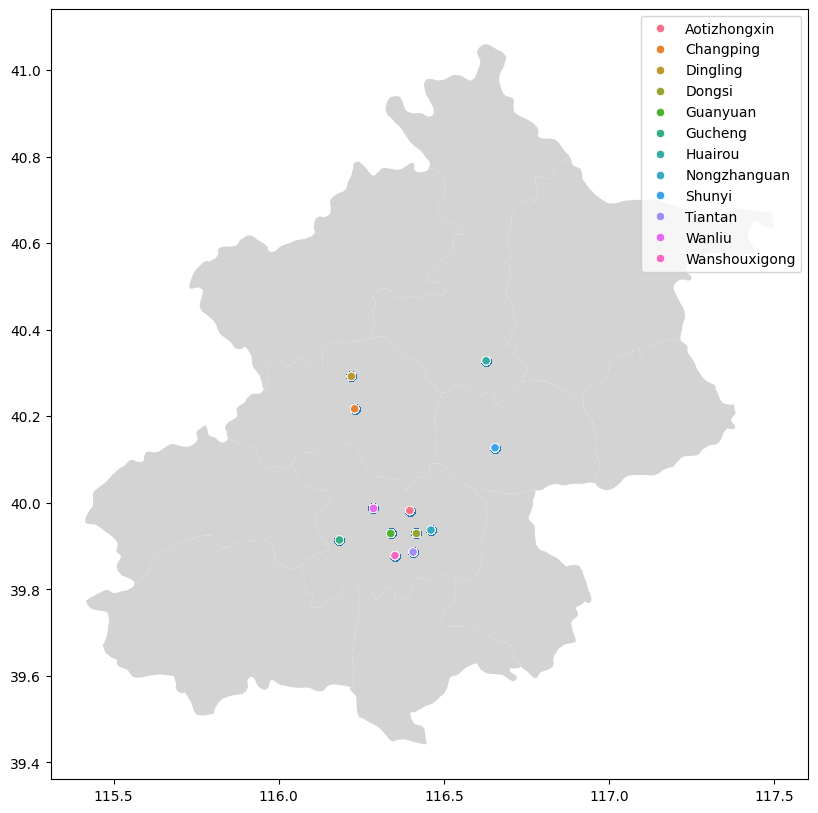

In [452]:
fig, ax = plt.subplots(figsize=(10, 10))
shp_beijing.plot(ax=ax, color='lightgray')

ax.scatter(air_qi['lon'], air_qi['lat'])
sns.scatterplot(x='lon', y='lat', hue='station', data=air_qi, palette='husl')
plt.xlabel('')
plt.ylabel('')
plt.legend()
plt.show()

### Eksplorasi Data Per Wilayah

##### Aotizhongxin

In [198]:
list_aq_daily_sta[0].describe()

,date,PM2_5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,WSPM,yearly
count,1461,1461.000000,1461.000000,1461.000000,1461.000000,1461.000000,1461.000000,1461.000000,1461.000000,1461.000000,1461.000000,1461.000000,1461.000000
mean,2015-03-01 00:00:00,82.752368,110.035551,17.381271,59.288253,1262.653720,55.954081,13.584365,1011.846913,3.123116,1.617180,1.708433,2.501027
min,2013-03-01 00:00:00,5.500000,7.750000,2.000000,6.833333,158.333333,1.000000,-15.233333,988.908333,-32.566667,0.000000,0.258333,1.000000
25%,2014-03-01 00:00:00,33.865386,52.958333,4.666667,39.916667,650.000000,25.791667,3.083333,1003.337500,-8.433333,0.000000,1.175000,2.000000
50%,2015-03-01 00:00:00,63.875000,92.968430,10.458333,54.833333,962.882608,51.166667,15.116667,1011.541667,3.600000,0.000000,1.541667,3.000000
75%,2016-02-29 00:00:00,109.916667,145.833333,21.041667,73.125000,1472.692945,79.375000,23.529167,1020.208333,15.429167,0.000000,2.054167,4.000000
max,2017-02-28 00:00:00,512.291667,545.875000,134.083333,170.958333,7487.500000,191.166667,32.350000,1039.945833,26.679167,235.600000,5.875000,4.000000
std,NaN,68.820021,76.119987,19.283492,27.850948,991.136740,37.768698,10.783578,10.196284,13.431237,8.409827,0.746526,1.118723


In [199]:
list_aq_mon_year_sta[0].describe()

,year,month,PM2_5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,WSPM,day,date
count,48.000000,48.000000,48.000000,48.000000,48.000000,48.000000,48.000000,48.000000,48.000000,48.000000,48.000000,48.000000,48.000000,48.0,48
mean,2014.666667,6.500000,82.752682,109.993632,17.433943,59.255386,1262.983003,55.878070,13.523362,1011.895759,3.049644,49.222917,1.709358,1.0,2015-02-15 02:00:00
min,2013.000000,1.000000,44.945641,49.938137,2.858739,28.401227,669.731344,16.387789,-4.550000,996.033065,-18.059677,0.000000,0.964113,1.0,2013-03-01 00:00:00
25%,2014.000000,3.750000,65.855832,84.479096,6.353214,50.901137,845.026199,31.026768,2.801217,1003.343683,-8.794241,2.625000,1.466566,1.0,2014-02-22 00:00:00
50%,2015.000000,6.500000,77.121719,107.440121,14.248959,59.680724,1094.251256,51.428120,13.946237,1011.951154,4.514323,13.700000,1.677877,1.0,2015-02-15 00:00:00
75%,2016.000000,9.250000,96.467258,133.023688,22.719000,68.783186,1478.268485,77.560822,22.432252,1020.118716,14.708576,73.975000,1.966655,1.0,2016-02-08 06:00:00
max,2017.000000,12.000000,153.311325,165.896211,58.159555,89.487252,3073.320984,119.175632,27.863306,1025.950000,21.459946,315.000000,2.483056,1.0,2017-02-01 00:00:00
std,1.190983,3.488583,25.208825,30.603258,13.478895,14.411600,544.357417,29.867080,10.455036,8.961374,12.506863,67.781122,0.388151,0.0,NaN


In [200]:
list_aq_monthly_sta[0].describe()

,month,PM2_5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,WSPM
count,12.000000,12.000000,12.000000,12.000000,12.000000,12.000000,12.000000,12.000000,12.000000,12.000000,12.000000,12.000000
mean,6.500000,82.722310,109.961281,17.424420,59.240267,1262.663666,55.883651,13.523433,1011.896637,3.047855,196.891667,1.709712
std,3.605551,16.284075,23.040812,10.816050,10.265771,489.022374,28.448689,10.748383,9.100351,12.779310,242.878187,0.299264
min,1.000000,56.234567,72.342817,4.596240,48.172440,801.968638,21.048433,-1.577370,999.078730,-14.263285,1.000000,1.349164
25%,3.750000,70.864958,87.320733,8.225826,49.358891,861.883608,27.866034,3.838381,1003.120010,-8.133543,28.800000,1.457871
50%,6.500000,81.121167,114.684703,15.989457,56.557700,1069.078843,49.677096,14.409752,1012.322757,3.724884,92.700000,1.650677
75%,9.250000,96.739938,125.461262,27.333743,67.645171,1536.613976,85.539884,22.205099,1020.585717,14.807743,340.125000,1.987480
max,12.000000,107.761765,149.875570,34.793590,74.240439,2175.511625,95.200314,27.195262,1023.201357,20.390759,795.300000,2.173958


In [ ]:
list_aq_yearly_sta[0].describe()

#### Changping

In [219]:
list_aq_daily_sta[1].describe()

,yearly,PM2_5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,WSPM
count,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000
mean,2.500000,71.109986,94.669133,14.964541,44.166908,1151.892522,57.971384,13.687060,1007.760152,1.504996,528.400000,1.853952
std,1.290994,7.633004,7.888496,8.031416,1.617766,53.730787,4.509215,0.489076,0.523890,0.514564,161.979402,0.123037
min,1.000000,62.395370,86.752983,8.532752,42.063094,1080.069825,53.464205,13.261234,1007.041484,0.860179,334.000000,1.674441
25%,1.750000,65.987606,89.496277,8.809589,43.356850,1132.576210,55.178508,13.326439,1007.600263,1.299967,449.275000,1.833357
50%,2.500000,71.640427,93.590598,12.896634,44.439938,1159.469893,57.262562,13.581799,1007.855192,1.525176,528.700000,1.894091
75%,3.250000,76.762807,98.763454,19.051586,45.249997,1178.786205,60.055438,13.942420,1008.015080,1.730205,607.825000,1.914685
max,4.000000,78.763720,104.742354,25.532143,45.724661,1208.560476,63.896205,14.323407,1008.288739,2.109450,722.200000,1.953185


In [ ]:
list_aq_mon_year_sta[1].describe()

In [ ]:
list_aq_monthly_sta[1].describe()

In [ ]:
list_aq_yearly_sta[1].describe()

#### Dingling

In [202]:
list_aq_daily_sta[2].describe()

,date,PM2_5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,WSPM,yearly
count,1461,1461.000000,1461.000000,1461.000000,1461.000000,1461.000000,1461.000000,1461.000000,1461.000000,1461.000000,1461.000000,1461.000000,1461.000000
mean,2015-03-01 00:00:00,66.004760,83.759115,11.760308,27.590774,904.947385,68.512701,13.687147,1007.760170,1.505409,1.446680,1.853974,2.501027
min,2013-03-01 00:00:00,4.041667,5.000000,1.291667,2.000000,100.000000,2.000000,-14.958333,985.812500,-32.229167,0.000000,0.454167,1.000000
25%,2014-03-01 00:00:00,21.875000,36.416667,3.500000,12.541667,420.833333,41.125000,3.295833,999.237500,-10.487500,0.000000,1.304167,2.000000
50%,2015-03-01 00:00:00,47.333333,66.583333,7.161752,21.044170,708.333333,66.458333,14.950000,1007.541667,1.470833,0.000000,1.641667,3.000000
75%,2016-02-29 00:00:00,89.502362,110.750000,15.166667,35.375000,1091.666667,89.429465,23.587500,1016.066667,14.016667,0.000000,2.166667,4.000000
max,2017-02-28 00:00:00,418.625000,441.625000,92.666667,150.041667,7695.833333,207.333333,32.366667,1034.933333,26.000000,161.000000,7.237500,4.000000
std,NaN,61.765974,64.369716,12.294131,21.379665,752.830083,38.554924,10.766773,10.005134,13.575394,6.617987,0.818359,1.118723


In [ ]:
list_aq_mon_year_sta[2].describe()


In [ ]:
list_aq_monthly_sta[2].describe()


In [ ]:
list_aq_yearly_sta[2].describe()

#### Dongsi

In [203]:
list_aq_daily_sta[3].describe()

,date,PM2_5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,WSPM,yearly
count,1461,1461.000000,1461.000000,1461.000000,1461.000000,1461.000000,1461.000000,1461.000000,1461.000000,1461.000000,1461.000000,1461.000000,1461.000000
mean,2015-03-01 00:00:00,86.163758,110.315206,18.532531,53.674585,1329.494570,57.241717,13.671269,1012.547407,2.447583,1.535592,1.860723,2.501027
min,2013-03-01 00:00:00,3.000000,4.833333,1.000000,7.750000,137.500000,1.541667,-15.233333,990.345833,-32.566667,0.000000,0.520833,1.000000
25%,2014-03-01 00:00:00,33.744054,52.462995,5.500000,36.750000,745.833333,27.666667,2.995833,1004.016667,-9.166667,0.000000,1.312500,2.000000
50%,2015-03-01 00:00:00,66.916667,90.875000,11.785885,49.583333,1133.333333,52.791667,15.104167,1012.470833,2.812500,0.000000,1.666667,3.000000
75%,2016-02-29 00:00:00,113.750000,142.041667,24.583333,64.541667,1533.333333,80.708333,23.600000,1020.958333,14.900000,0.000000,2.208333,4.000000
max,2017-02-28 00:00:00,567.416667,584.666667,132.749364,174.000000,8166.666667,504.176929,32.350000,1039.945833,27.258333,235.600000,6.095833,4.000000
std,NaN,72.743870,79.292878,19.329233,25.042599,946.467962,38.388909,10.898286,10.056938,13.537901,8.100673,0.786166,1.118723


In [ ]:
list_aq_mon_year_sta[3].describe()


In [ ]:
list_aq_monthly_sta[3].describe()


In [ ]:
list_aq_yearly_sta[3].describe()

#### Guanyuan

In [204]:
list_aq_daily_sta[4].describe()

,date,PM2_5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,WSPM,yearly
count,1461,1461.000000,1461.000000,1461.000000,1461.000000,1461.000000,1461.000000,1461.000000,1461.000000,1461.000000,1461.000000,1461.000000,1461.000000
mean,2015-03-01 00:00:00,82.913939,109.003124,17.596148,57.877696,1270.926319,55.611424,13.584365,1011.846913,3.123116,1.617180,1.708433,2.501027
min,2013-03-01 00:00:00,5.125000,7.291667,1.666667,6.041667,120.833333,1.000000,-15.233333,988.908333,-32.566667,0.000000,0.258333,1.000000
25%,2014-03-01 00:00:00,34.375000,54.083333,4.750000,38.666667,679.166667,24.958333,3.083333,1003.337500,-8.433333,0.000000,1.175000,2.000000
50%,2015-03-01 00:00:00,64.166667,93.833333,10.291667,51.541667,1020.833333,48.791667,15.116667,1011.541667,3.600000,0.000000,1.541667,3.000000
75%,2016-02-29 00:00:00,110.958333,140.708333,22.416667,70.958333,1481.362790,81.208333,23.529167,1020.208333,15.429167,0.000000,2.054167,4.000000
max,2017-02-28 00:00:00,536.083333,555.416667,146.555000,169.125000,7870.833333,174.000000,32.350000,1039.945833,26.679167,235.600000,5.875000,4.000000
std,NaN,68.511916,74.040512,19.884143,27.228535,960.991574,38.385753,10.783578,10.196284,13.431237,8.409827,0.746526,1.118723


In [ ]:
list_aq_mon_year_sta[4].describe()


In [ ]:
list_aq_monthly_sta[4].describe()


In [ ]:
list_aq_yearly_sta[4].describe()

#### Gucheng

In [205]:
list_aq_daily_sta[5].describe()

,date,PM2_5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,WSPM,yearly
count,1461,1461.000000,1461.000000,1461.000000,1461.000000,1461.000000,1461.000000,1461.000000,1461.000000,1461.000000,1461.000000,1461.000000,1461.000000
mean,2015-03-01 00:00:00,83.830699,118.838646,15.367761,55.842665,1323.467425,57.726472,13.864886,1008.829386,2.610355,1.544969,1.343389,2.501027
min,2013-03-01 00:00:00,5.333333,6.333333,1.583333,4.583333,140.836605,2.000000,-14.291667,986.887500,-31.633333,0.000000,0.170833,1.000000
25%,2014-03-01 00:00:00,35.458333,61.791667,3.250000,36.041667,691.666667,25.916667,3.591667,1000.412500,-9.104348,0.000000,0.825000,2.000000
50%,2015-03-01 00:00:00,65.958333,106.708333,8.291667,50.416667,1020.833333,52.397059,15.258333,1008.791667,2.879167,0.000000,1.145833,3.000000
75%,2016-02-29 00:00:00,109.708333,153.375000,21.000000,71.999188,1570.833333,82.625000,23.733333,1016.916667,15.120833,0.000000,1.670833,4.000000
max,2017-02-28 00:00:00,519.750000,564.666667,119.427484,188.291667,8904.166667,182.041667,32.029167,1036.158333,25.933333,266.600000,7.195833,4.000000
std,NaN,69.710295,74.990641,17.579549,27.563919,1002.869387,37.803196,10.678771,9.882538,13.520671,9.143068,0.775193,1.118723


In [ ]:
list_aq_mon_year_sta[5].describe()


In [ ]:
list_aq_monthly_sta[5].describe()


In [ ]:
list_aq_yearly_sta[5].describe()

#### Huairou

In [206]:
list_aq_daily_sta[6].describe()

,date,PM2_5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,WSPM,yearly
count,1461,1461.000000,1461.000000,1461.000000,1461.000000,1461.000000,1461.000000,1461.000000,1461.000000,1461.000000,1461.000000,1461.000000,1461.000000
mean,2015-03-01 00:00:00,69.613101,91.472776,12.113352,32.406770,1022.033766,59.772768,12.446757,1007.598465,2.238342,1.627995,1.652225,2.501027
min,2013-03-01 00:00:00,3.208333,5.208333,1.083333,2.541667,168.818778,2.000000,-15.683333,985.787500,-32.829167,0.000000,0.554167,1.000000
25%,2014-03-01 00:00:00,26.750000,42.125000,3.083333,17.833333,554.166667,31.583333,1.850000,999.433333,-10.066667,0.000000,1.166667,2.000000
50%,2015-03-01 00:00:00,51.416667,77.375000,6.291667,27.916667,858.333333,53.500000,13.975000,1007.545833,2.329167,0.000000,1.483333,3.000000
75%,2016-02-29 00:00:00,94.458333,124.166667,14.458333,42.544300,1265.454019,81.333333,22.666667,1015.408333,15.150000,0.000000,1.879167,4.000000
max,2017-02-28 00:00:00,445.958333,506.708333,136.375000,123.208333,7216.666667,185.083333,31.075000,1034.500000,27.616667,134.600000,5.470833,4.000000
std,NaN,59.325617,64.643837,14.674908,19.841606,713.672598,37.814935,10.992498,9.794562,13.773436,7.632314,0.722366,1.118723


In [ ]:
list_aq_mon_year_sta[6].describe()


In [ ]:
list_aq_monthly_sta[6].describe()


In [ ]:
list_aq_yearly_sta[6].describe()

#### Nongzhanguan

In [207]:
list_aq_daily_sta[7].describe()

,date,PM2_5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,WSPM,yearly
count,1461,1461.000000,1461.000000,1461.000000,1461.000000,1461.000000,1461.000000,1461.000000,1461.000000,1461.000000,1461.000000,1461.000000,1461.000000
mean,2015-03-01 00:00:00,84.811723,108.972658,18.692361,58.051380,1323.949890,58.602611,13.671269,1012.547407,2.447583,1.535592,1.860723,2.501027
min,2013-03-01 00:00:00,5.625000,7.583333,1.000000,9.392475,100.000000,1.125000,-15.233333,990.345833,-32.566667,0.000000,0.520833,1.000000
25%,2014-03-01 00:00:00,33.375000,52.666667,5.000000,38.708333,687.500000,26.882100,2.995833,1004.016667,-9.166667,0.000000,1.312500,2.000000
50%,2015-03-01 00:00:00,63.541667,90.708333,11.166667,52.458333,1050.000000,52.935725,15.104167,1012.470833,2.812500,0.000000,1.666667,3.000000
75%,2016-02-29 00:00:00,113.041667,141.000000,23.833333,71.479250,1600.000000,82.708333,23.600000,1020.958333,14.900000,0.000000,2.208333,4.000000
max,2017-02-28 00:00:00,496.506629,505.708333,145.083333,188.542851,7841.775071,185.500000,32.350000,1039.945833,27.258333,235.600000,6.095833,4.000000
std,NaN,72.265598,76.783774,20.586388,26.854199,1006.352923,38.660505,10.898286,10.056938,13.537901,8.100673,0.786166,1.118723


In [ ]:
list_aq_mon_year_sta[7].describe()


In [ ]:
list_aq_monthly_sta[7].describe()


In [ ]:
list_aq_yearly_sta[7].describe()

#### Shunyi

In [208]:
list_aq_daily_sta[8].describe()

,date,PM2_5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,WSPM,yearly
count,1461,1461.000000,1461.000000,1461.000000,1461.000000,1461.000000,1461.000000,1461.000000,1461.000000,1461.000000,1461.000000,1461.000000,1461.000000
mean,2015-03-01 00:00:00,79.461903,98.712461,13.570362,43.862141,1187.220579,54.927609,13.389235,1013.061597,2.464767,1.464134,1.807718,2.501027
min,2013-03-01 00:00:00,4.375000,5.000000,1.083333,5.625000,100.000000,2.000000,-15.312500,991.070833,-33.020833,0.000000,0.525000,1.000000
25%,2014-03-01 00:00:00,29.500000,46.000000,3.458333,27.583333,598.719430,27.188345,2.737500,1004.741667,-9.125000,0.000000,1.303782,2.000000
50%,2015-03-01 00:00:00,61.541667,82.416667,7.626722,38.833333,964.708573,49.842637,14.966667,1012.975000,2.770833,0.000000,1.645833,3.000000
75%,2016-02-29 00:00:00,107.625000,131.416667,17.375000,55.875000,1448.041906,76.350349,23.333333,1020.995833,14.925000,0.000000,2.095449,4.000000
max,2017-02-28 00:00:00,514.625000,515.333333,156.416667,141.625000,7163.767917,171.375000,32.075000,1041.025000,25.841667,143.500000,5.783333,4.000000
std,NaN,66.050044,69.314649,15.370827,21.994771,874.724131,35.193131,10.872262,9.949032,13.427016,6.969937,0.766458,1.118723


In [ ]:
list_aq_mon_year_sta[8].describe()


In [ ]:
list_aq_monthly_sta[8].describe()


In [ ]:
list_aq_yearly_sta[8].describe()

#### Tiantan

In [209]:
list_aq_daily_sta[9].describe()

,date,PM2_5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,WSPM,yearly
count,1461,1461.000000,1461.000000,1461.000000,1461.000000,1461.000000,1461.000000,1461.000000,1461.000000,1461.000000,1461.000000,1461.000000,1461.000000
mean,2015-03-01 00:00:00,82.149918,106.350399,14.380992,53.145419,1298.250273,56.002158,13.671269,1012.547407,2.447583,1.535592,1.860723,2.501027
min,2013-03-01 00:00:00,5.416667,7.208333,1.083333,3.791667,200.000000,1.208333,-15.233333,990.345833,-32.566667,0.000000,0.520833,1.000000
25%,2014-03-01 00:00:00,33.416667,54.750000,4.583333,36.083333,695.833333,25.625000,2.995833,1004.016667,-9.166667,0.000000,1.312500,2.000000
50%,2015-03-01 00:00:00,63.125000,88.833333,8.958333,48.083333,1025.000000,50.791667,15.104167,1012.470833,2.812500,0.000000,1.666667,3.000000
75%,2016-02-29 00:00:00,108.541667,136.255067,18.041667,64.625000,1537.500000,79.762765,23.600000,1020.958333,14.900000,0.000000,2.208333,4.000000
max,2017-02-28 00:00:00,499.333333,537.125000,126.666667,170.666667,8570.833333,200.666667,32.350000,1039.945833,27.258333,235.600000,6.095833,4.000000
std,NaN,68.380510,72.162802,15.451858,24.003275,959.173042,37.546238,10.898286,10.056938,13.537901,8.100673,0.786166,1.118723


In [ ]:
list_aq_mon_year_sta[9].describe()


In [ ]:
list_aq_monthly_sta[9].describe()


In [ ]:
list_aq_yearly_sta[9].describe()

#### Wanliu

In [210]:
list_aq_daily_sta[10].describe()

,date,PM2_5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,WSPM,yearly
count,1461,1461.000000,1461.000000,1461.000000,1461.000000,1461.000000,1461.000000,1461.000000,1461.000000,1461.000000,1461.000000,1461.000000,1461.000000
mean,2015-03-01 00:00:00,83.356972,110.448833,18.373858,65.232154,1319.171887,48.154347,13.428585,1011.097529,3.266655,1.637372,1.501154,2.501027
min,2013-03-01 00:00:00,4.291667,6.333333,2.000000,9.007537,100.000000,1.000000,-14.166667,988.908333,-31.641667,0.000000,0.258333,1.000000
25%,2014-03-01 00:00:00,33.750000,53.583333,5.541667,44.333333,683.333333,20.125000,2.995833,1002.479167,-8.429167,0.000000,1.045833,2.000000
50%,2015-03-01 00:00:00,64.916667,93.875000,12.018272,59.958333,1003.329316,41.375000,14.916667,1010.900000,3.754167,0.000000,1.345833,3.000000
75%,2016-02-29 00:00:00,110.000000,142.416667,23.393272,81.500000,1533.333333,68.916667,23.204167,1019.462500,15.583333,0.000000,1.779167,4.000000
max,2017-02-28 00:00:00,481.291667,514.375000,149.416667,193.333333,8029.166667,173.491064,31.437500,1038.529167,26.679167,252.000000,4.758333,4.000000
std,NaN,69.637741,74.827549,19.441286,29.676269,1032.196043,35.082496,10.650052,10.144868,13.423629,8.899781,0.653837,1.118723


In [ ]:
list_aq_mon_year_sta[10].describe()


In [ ]:
list_aq_monthly_sta[10].describe()


In [ ]:
list_aq_yearly_sta[10].describe()

#### Wanshouxigong

In [211]:
list_aq_daily_sta[11].describe()

,date,PM2_5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,WSPM,yearly
count,1461,1461.000000,1461.000000,1461.000000,1461.000000,1461.000000,1461.000000,1461.000000,1461.000000,1461.000000,1461.000000,1461.000000,1461.000000
mean,2015-03-01 00:00:00,85.010643,112.218581,17.151516,55.510938,1370.294764,56.045917,13.784244,1011.511799,2.707485,1.542847,1.745255,2.501027
min,2013-03-01 00:00:00,3.833333,6.041667,1.541667,8.833333,145.833333,1.000000,-15.233333,987.900000,-32.566667,0.000000,0.520833,1.000000
25%,2014-03-01 00:00:00,34.993269,55.041667,4.125000,36.041667,745.833333,25.666667,3.325000,1003.012500,-8.779167,0.000000,1.233333,2.000000
50%,2015-03-01 00:00:00,64.666667,95.458333,9.541667,49.708991,1108.333333,51.125000,15.450000,1011.033333,3.158333,0.000000,1.570833,3.000000
75%,2016-02-29 00:00:00,110.916667,141.833333,21.972808,68.041667,1608.333333,80.965265,23.825000,1020.033333,15.000000,0.000000,2.070833,4.000000
max,2017-02-28 00:00:00,536.625000,560.541667,137.416667,175.875000,8783.333333,190.166667,32.350000,1039.945833,26.337500,235.600000,5.875000,4.000000
std,NaN,72.150294,77.867829,20.102359,27.623445,1002.525873,37.660668,10.800554,10.369763,13.429261,8.027943,0.741803,1.118723


In [ ]:
list_aq_mon_year_sta[11].describe()


In [ ]:
list_aq_monthly_sta[11].describe()


In [ ]:
list_aq_yearly_sta[11].describe()

### Eksplorasi Hubungan Curah Hujan dengan Parameter Kualitas Udara

In [ ]:
dataa = pd.DataFrame(air_qi_monthly)
cormat = dataa.corr(method='pearson', numeric_only=True)
correlRainQI = pd.DataFrame(cormat)
correlRainQI = correlRainQI['RAIN'][1:7]
correlRainQI

## Visualization & Explanatory Analysis

### What are the climate characteristics of Beijing City?

#### Temperature and Dew Point Temperature

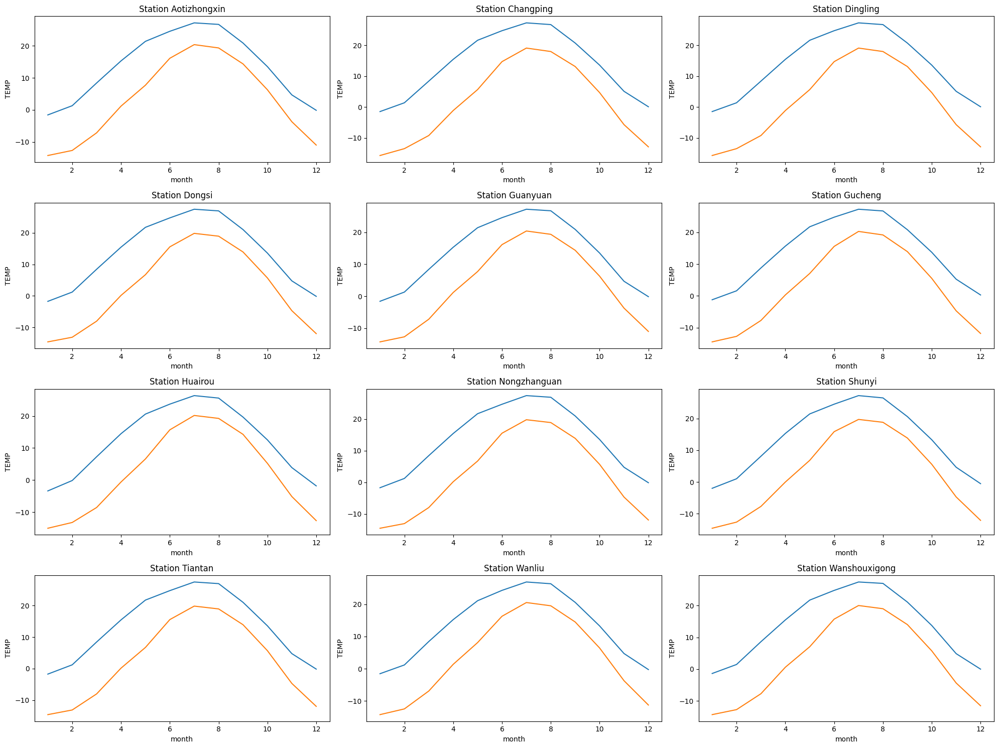

In [235]:
fig, axes = plt.subplots(nrows=4, ncols=3, figsize=(20, 15))  # Sesuaikan nrows dan ncols dengan jumlah plot

for i, ax in enumerate(axes.flat):
    # Ganti 'column_name' dengan nama kolom data untuk setiap line plot
    df = list_aq_monthly_sta[i]
    sns.lineplot(x='month', y='TEMP', data=df, ax=ax)
    sns.lineplot(x='month', y='DEWP', data=df, ax=ax)
    ax.set_title(f'Station {stations[i]}')  # Set judul untuk setiap plot

plt.tight_layout()  # Menyesuaikan tata letak agar rapi
plt.show()

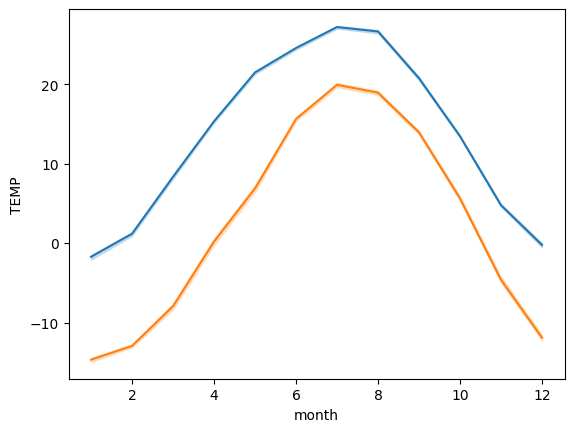

In [234]:
sns.lineplot(x=air_qi_monthly['month'], y=air_qi_monthly['TEMP'], legend=True)
sns.lineplot(x=air_qi_monthly['month'], y=air_qi_monthly['DEWP'], legend=True)
# plt.legend()
plt.show()

In general, air temperature in Beijing City has a same pattern at each observation station. The highest temperature occurs in the middle of the year because it coincides with summer in the northern hemisphere, whereas the lowest temperature occurs at the end of the year which coincides with winter.

#### Precipitation in Beijing

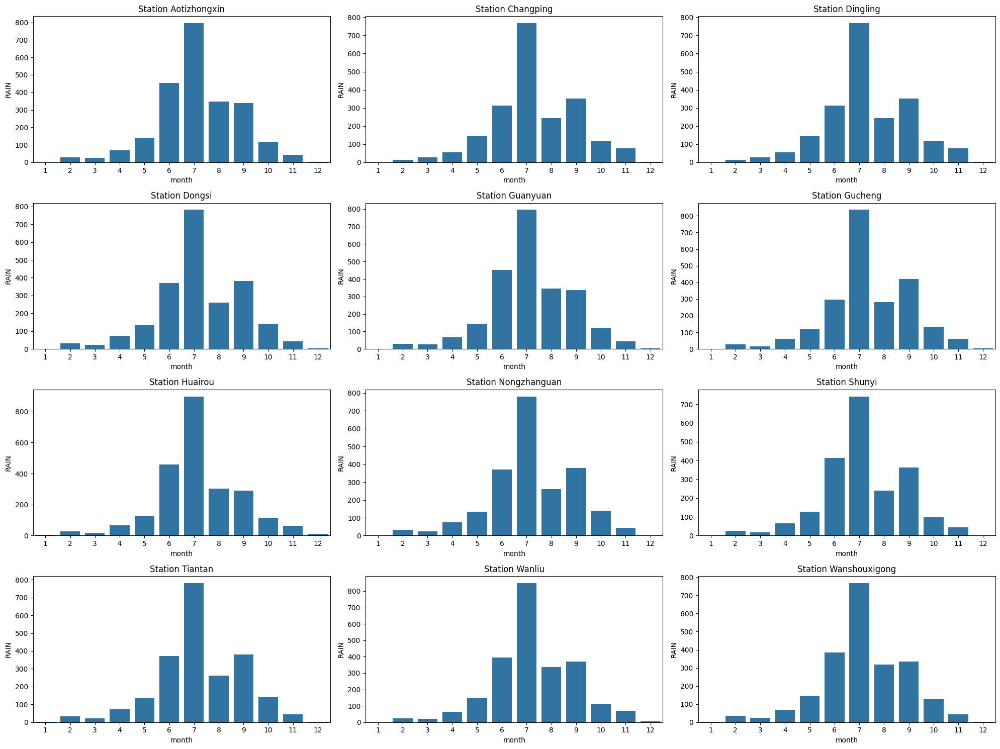

In [236]:
fig, axes = plt.subplots(nrows=4, ncols=3, figsize=(20, 15))  # Sesuaikan nrows dan ncols dengan jumlah plot

for i, ax in enumerate(axes.flat):
    # Ganti 'column_name' dengan nama kolom data untuk setiap line plot
    df = list_aq_monthly_sta[i]
    sns.barplot(x='month', y='RAIN', data=df, ax=ax)
    ax.set_title(f'Station {stations[i]}')  # Set judul untuk setiap plot

plt.tight_layout()  # Menyesuaikan tata letak agar rapi
plt.show()

<Axes: xlabel='month', ylabel='RAIN'>

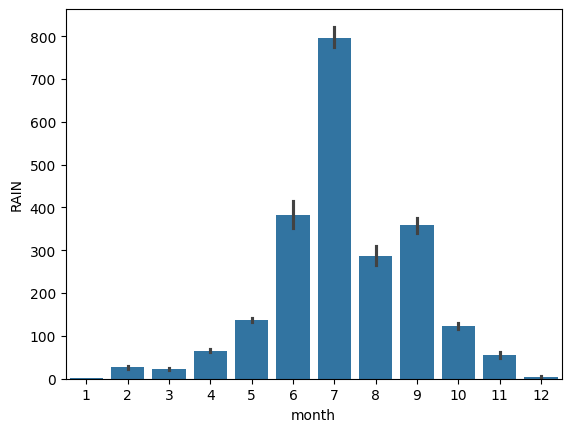

In [237]:
sns.barplot(x='month', y='RAIN', data=air_qi_monthly)

The highest rainfall occurs during the summer in July.

#### Pressure in Beijing

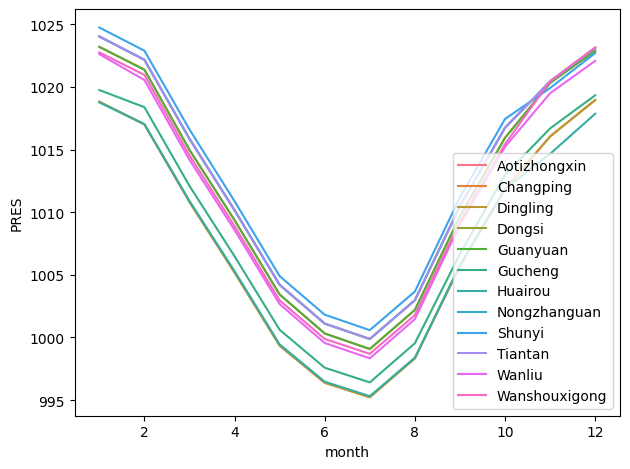

In [264]:
# Ganti 'column_name' dengan nama kolom data untuk setiap line plot
sns.lineplot(x='month', y='PRES', data=air_qi_monthly, hue='station', legend='auto')
plt.legend(loc='lower right')
plt.tight_layout()  # Menyesuaikan tata letak agar rapi
plt.show()

<Axes: xlabel='month', ylabel='PRES'>

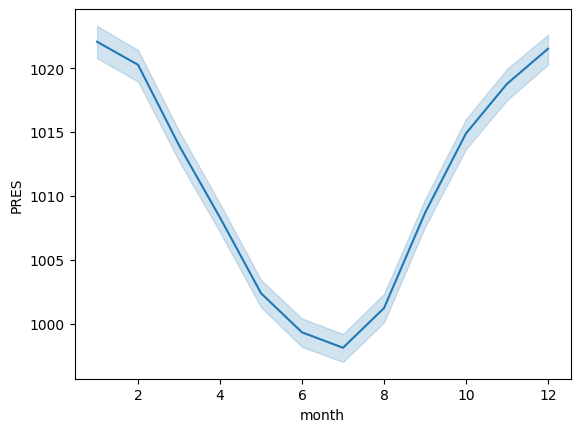

In [238]:
sns.lineplot(x='month', y='PRES', data=air_qi_monthly)

The air pressure at each observation point is different. This is generally influenced by the elevation position of the observation station in Beijing City

#### WSPM and Wind Direction Domination in Beijing

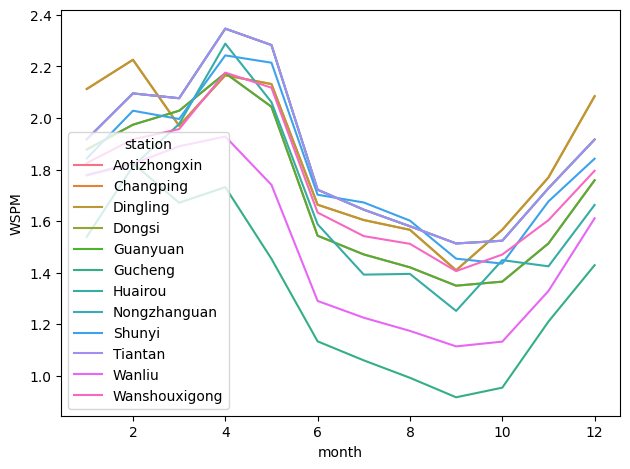

In [262]:
# Ganti 'column_name' dengan nama kolom data untuk setiap line plot
sns.lineplot(x='month', y='WSPM', data=air_qi_monthly, hue='station', legend='auto')
plt.tight_layout()  # Menyesuaikan tata letak agar rapi
plt.show()

In [ ]:
sns.lineplot(x='month', y='WSPM', data=air_qi_monthly)

In general, the wind speed in Beijing City has the lowest speed in the autumn period. Meanwhile, the highest wind speeds occur during the spring period.

In [440]:
wd_beijing = air_qi_monthly[['station','wd']].groupby(['station']).agg(statistics.mode)
wd_beijing.reset_index(inplace=True)
wd_beijing2 = pd.merge(
    left=wd_beijing,
    right=locsta,
    how='left',
    left_on='station',
    right_on='station'
)
wd_beijing2

wd_beijing2['geometry'] = wd_beijing2.apply(lambda row: Point(row['lon'], row['lat']), axis=1)
wd_beijing2


,station,wd,location,lon,lat,elevation,geometry
0,Aotizhongxin,NE,Inside Olympic Center (Sports Center in urban),116.397,39.982,42,POINT (116.397 39.982)
1,Changping,NNW,Urban Area of Changping (Block in town),116.230,40.217,74,POINT (116.23 40.217)
2,Dingling,NNW,"Dingling, Changping (Park in suburban)",116.220,40.292,231,POINT (116.22 40.292)
3,Dongsi,NE,Dongcheng District Environmental Protection Bu...,116.417,39.929,31,POINT (116.417 39.929)
4,Guanyuan,NE,Beijing Municipal Party School (School in urban),116.339,39.929,47,POINT (116.339 39.929)
5,Gucheng,N,Shijingshan Environmental Protection Bureau (I...,116.184,39.914,71,POINT (116.184 39.914)
6,Huairou,WNW,Urban Area of Huairou (Block in town),116.628,40.328,52,POINT (116.628 40.328)
7,Nongzhanguan,NE,Residential Area of Agricultural Exhibition Ha...,116.461,39.937,43,POINT (116.461 39.937)
8,Shunyi,NNE,Urban Area of Shunyi (Block in town),116.655,40.127,15,POINT (116.655 40.127)
9,Tiantan,NE,Inside Temple of Heaven Park (Park in urban),116.407,39.886,33,POINT (116.407 39.886)


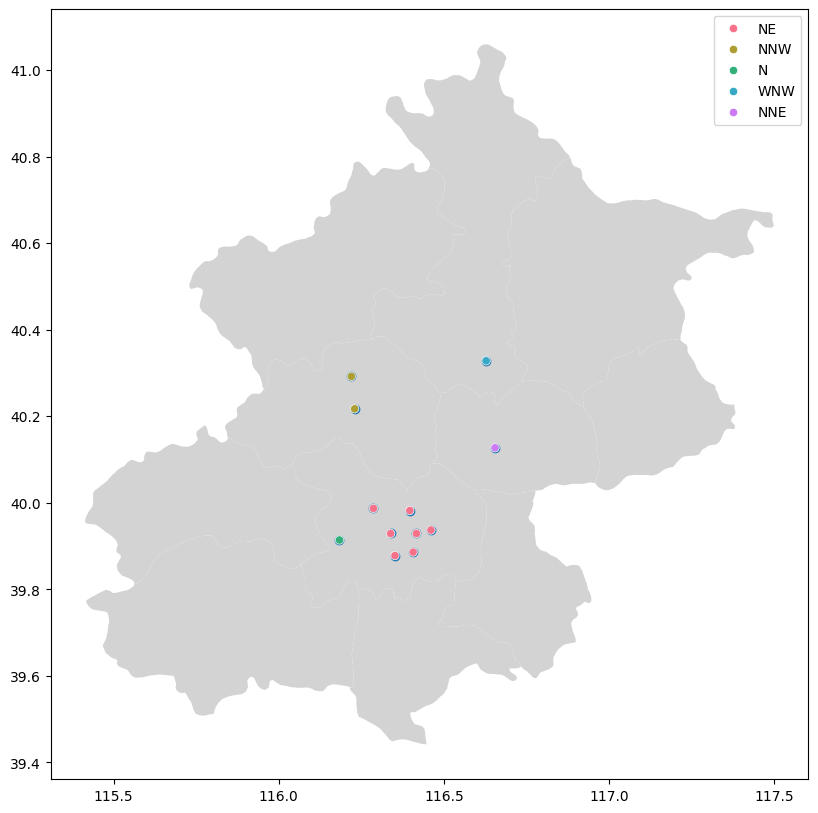

In [441]:
fig, ax = plt.subplots(figsize=(10, 10))
shp_beijing.plot(ax=ax, color='lightgray')

ax.scatter(wd_beijing2['lon'], wd_beijing2['lat'])
sns.scatterplot(x='lon', y='lat', hue='wd', data=wd_beijing2, palette='husl')
plt.xlabel('')
plt.ylabel('')
plt.legend()
plt.show()

Each observation station which is quite far apart records various wind directions. This indicates that each point in Beijing City may have different topography so that the wind direction at each point tends to be different.

### How is the seasonal pattern of pollutant levels in Beijing?


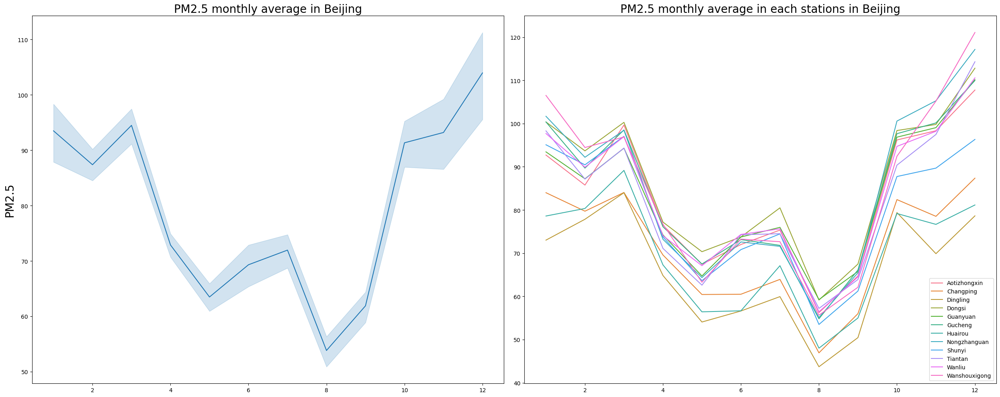

In [331]:
# PM2.5 

fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(25, 10))  # Sesuaikan nrows dan ncols dengan jumlah plot
sns.lineplot(x='month', y='PM2_5', data=air_qi_monthly, ax=axes[0])
axes[0].set_title('PM2.5 monthly average in Beijing', size=20)
axes[0].set_xlabel('')
axes[0].set_ylabel("PM2.5", size=20)

sns.lineplot(x='month', y='PM2_5', data=air_qi_monthly, hue='station', legend='auto', ax=axes[1])
axes[1].set_title('PM2.5 monthly average in each stations in Beijing', size=20)
axes[1].set_xlabel('')
axes[1].set_ylabel('')

plt.legend(loc='lower right')
plt.tight_layout() 
plt.show()

PM2.5 concentrations were recorded at their lowest during summer, when this period also saw high rainfall. The same thing happens during winter when rainfall is low, PM2.5 concentrations record high conditions.

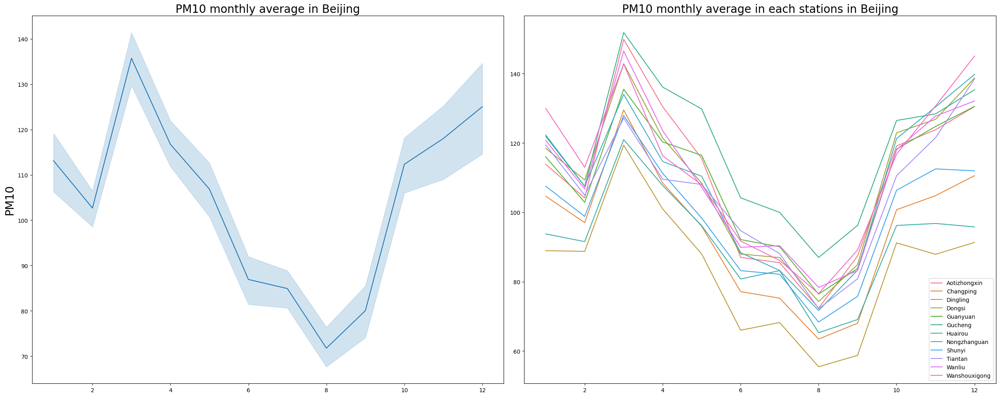

In [332]:
# PM10 

fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(25, 10))  # Sesuaikan nrows dan ncols dengan jumlah plot
sns.lineplot(x='month', y='PM10', data=air_qi_monthly, ax=axes[0])
axes[0].set_title('PM10 monthly average in Beijing', size=20)
axes[0].set_xlabel('')
axes[0].set_ylabel("PM10", size=20)

sns.lineplot(x='month', y='PM10', data=air_qi_monthly, hue='station', legend='auto', ax=axes[1])
axes[1].set_title('PM10 monthly average in each stations in Beijing', size=20)
axes[1].set_xlabel('')
axes[1].set_ylabel('')

plt.legend(loc='lower right')
plt.tight_layout() 
plt.show()

PM10 concentration trends have a similar pattern to PM2.5 concentrations.

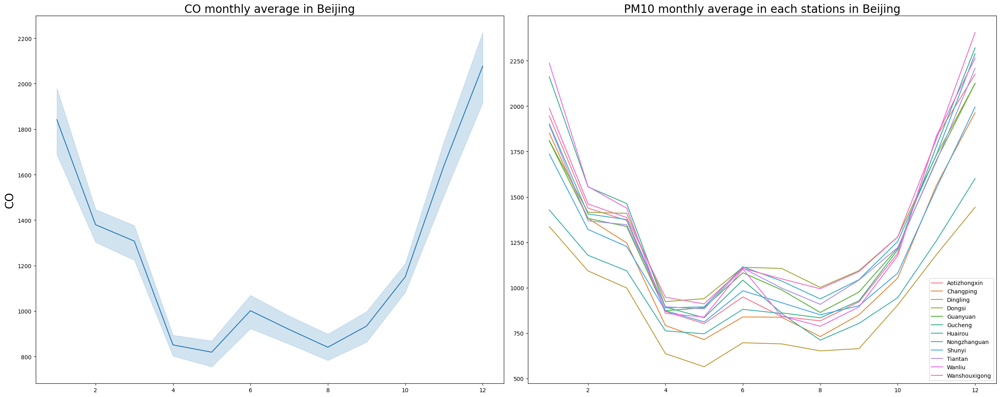

In [333]:
# CO 

fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(25, 10))  # Sesuaikan nrows dan ncols dengan jumlah plot
sns.lineplot(x='month', y='CO', data=air_qi_monthly, ax=axes[0])
axes[0].set_title('CO monthly average in Beijing', size=20)
axes[0].set_xlabel('')
axes[0].set_ylabel("CO", size=20)

sns.lineplot(x='month', y='CO', data=air_qi_monthly, hue='station', legend='auto', ax=axes[1])
axes[1].set_title('CO monthly average in each stations in Beijing', size=20)
axes[1].set_xlabel('')
axes[1].set_ylabel('')

plt.legend(loc='lower right')
plt.tight_layout() 
plt.show()

Contrast to particulate matter concentrations, CO trends record the lowest conditions in summer and the highest conditions in winter.

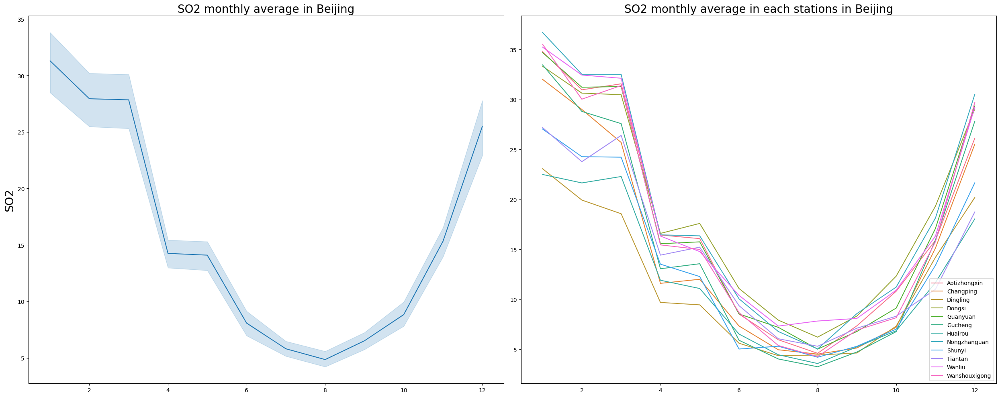

In [334]:
# SO2 

fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(25, 10))  # Sesuaikan nrows dan ncols dengan jumlah plot
sns.lineplot(x='month', y='SO2', data=air_qi_monthly, ax=axes[0])
axes[0].set_title('SO2 monthly average in Beijing', size=20)
axes[0].set_xlabel('')
axes[0].set_ylabel("SO2", size=20)

sns.lineplot(x='month', y='SO2', data=air_qi_monthly, hue='station', legend='auto', ax=axes[1])
axes[1].set_title('SO2 monthly average in each stations in Beijing', size=20)
axes[1].set_xlabel('')
axes[1].set_ylabel('')

plt.legend(loc='lower right')
plt.tight_layout() 
plt.show()

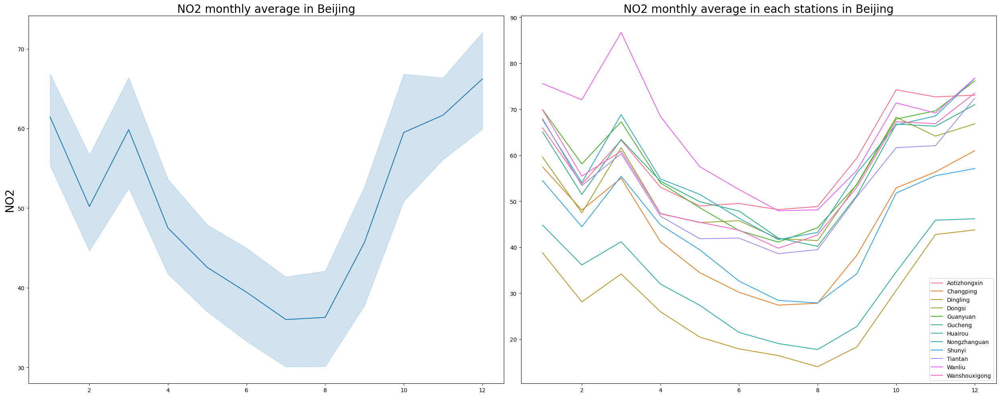

In [335]:
# NO2 

fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(25, 10))  # Sesuaikan nrows dan ncols dengan jumlah plot
sns.lineplot(x='month', y='NO2', data=air_qi_monthly, ax=axes[0])
axes[0].set_title('NO2 monthly average in Beijing', size=20)
axes[0].set_xlabel('')
axes[0].set_ylabel("NO2", size=20)

sns.lineplot(x='month', y='NO2', data=air_qi_monthly, hue='station', legend='auto', ax=axes[1])
axes[1].set_title('NO2 monthly average in each stations in Beijing', size=20)
axes[1].set_xlabel('')
axes[1].set_ylabel('')

plt.legend(loc='lower right')
plt.tight_layout() 
plt.show()

SO2 and NO2 concentrations recorded similar trends to CO concentrations.

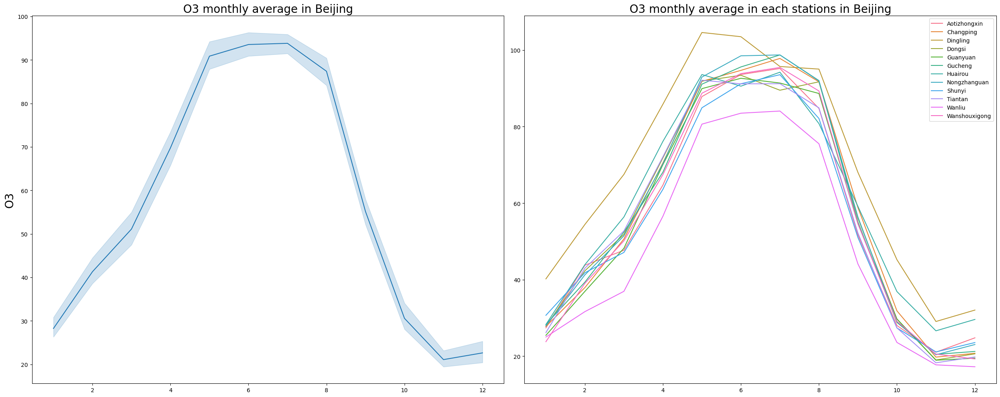

In [337]:
# O3 

fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(25, 10))  # Sesuaikan nrows dan ncols dengan jumlah plot
sns.lineplot(x='month', y='O3', data=air_qi_monthly, ax=axes[0])
axes[0].set_title('O3 monthly average in Beijing', size=20)
axes[0].set_xlabel('')
axes[0].set_ylabel("O3", size=20)

sns.lineplot(x='month', y='O3', data=air_qi_monthly, hue='station', legend='auto', ax=axes[1])
axes[1].set_title('O3 monthly average in each stations in Beijing', size=20)
axes[1].set_xlabel('')
axes[1].set_ylabel('')

plt.legend(loc='upper right')
plt.tight_layout() 
plt.show()

O3 concentrations recorded similar trends to PM2.5 and PM10 concentrations.

### What is the trend of pollutant levels over the last 4 years?


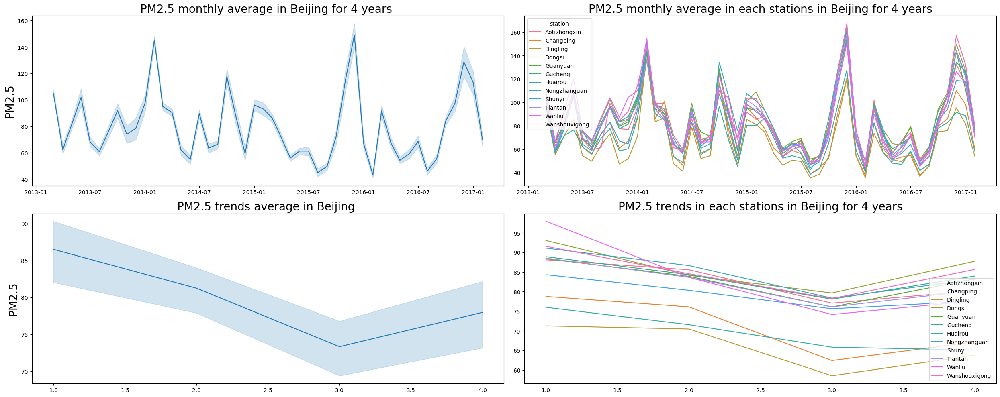

In [351]:
# PM2.5 

fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(25, 10))  # Sesuaikan nrows dan ncols dengan jumlah plot
sns.lineplot(x='date', y='PM2_5', data=air_qi_monthly_ey, ax=axes[0,0])
axes[0,0].set_title('PM2.5 monthly average in Beijing for 4 years ', size=20)
axes[0,0].set_xlabel('')
axes[0,0].set_ylabel("PM2.5", size=20)

sns.lineplot(x='date', y='PM2_5', data=air_qi_monthly_ey, hue='station', legend='auto', ax=axes[0,1])
axes[0,1].set_title('PM2.5 monthly average in each stations in Beijing for 4 years', size=20)
axes[0,1].set_xlabel('')
axes[0,1].set_ylabel('')

sns.lineplot(x='yearly', y='PM2_5', data=air_qi_yearly, ax=axes[1,0])
axes[1,0].set_title('PM2.5 trends average in Beijing ', size=20)
axes[1,0].set_xlabel('')
axes[1,0].set_ylabel("PM2.5", size=20)

sns.lineplot(x='yearly', y='PM2_5', data=air_qi_yearly, hue='station', legend='auto', ax=axes[1,1])
axes[1,1].set_title('PM2.5 trends in each stations in Beijing for 4 years', size=20)
axes[1,1].set_xlabel('')
axes[1,1].set_ylabel('')

plt.legend(loc='lower right')
plt.tight_layout() 
plt.show()

In general, PM2.5 concentrations experienced a decreasing trend until the third year of 2016, but then increased again until 2017.

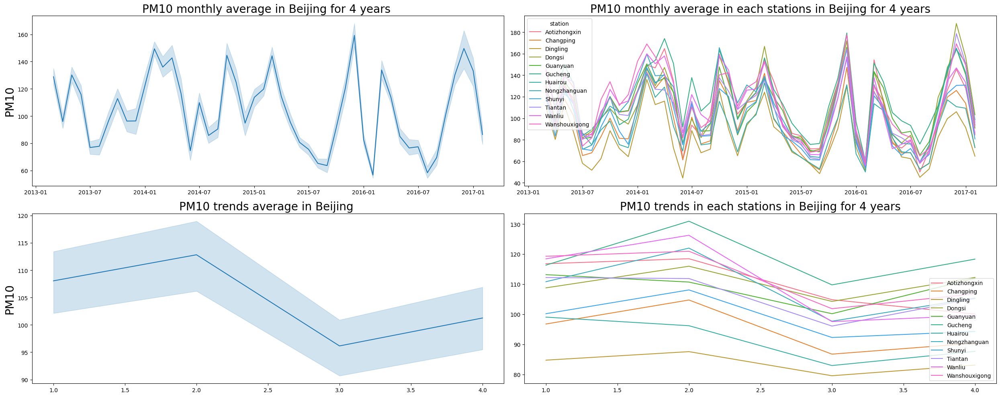

In [353]:
# PM10 
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(25, 10))  # Sesuaikan nrows dan ncols dengan jumlah plot
sns.lineplot(x='date', y='PM10', data=air_qi_monthly_ey, ax=axes[0,0])
axes[0,0].set_title('PM10 monthly average in Beijing for 4 years ', size=20)
axes[0,0].set_xlabel('')
axes[0,0].set_ylabel("PM10", size=20)

sns.lineplot(x='date', y='PM10', data=air_qi_monthly_ey, hue='station', legend='auto', ax=axes[0,1])
axes[0,1].set_title('PM10 monthly average in each stations in Beijing for 4 years', size=20)
axes[0,1].set_xlabel('')
axes[0,1].set_ylabel('')

sns.lineplot(x='yearly', y='PM10', data=air_qi_yearly, ax=axes[1,0])
axes[1,0].set_title('PM10 trends average in Beijing ', size=20)
axes[1,0].set_xlabel('')
axes[1,0].set_ylabel("PM10", size=20)

sns.lineplot(x='yearly', y='PM10', data=air_qi_yearly, hue='station', legend='auto', ax=axes[1,1])
axes[1,1].set_title('PM10 trends in each stations in Beijing for 4 years', size=20)
axes[1,1].set_xlabel('')
axes[1,1].set_ylabel('')

plt.legend(loc='lower right')
plt.tight_layout() 
plt.show()

In general, PM10 concentrations have a fluctuative trend year on year.

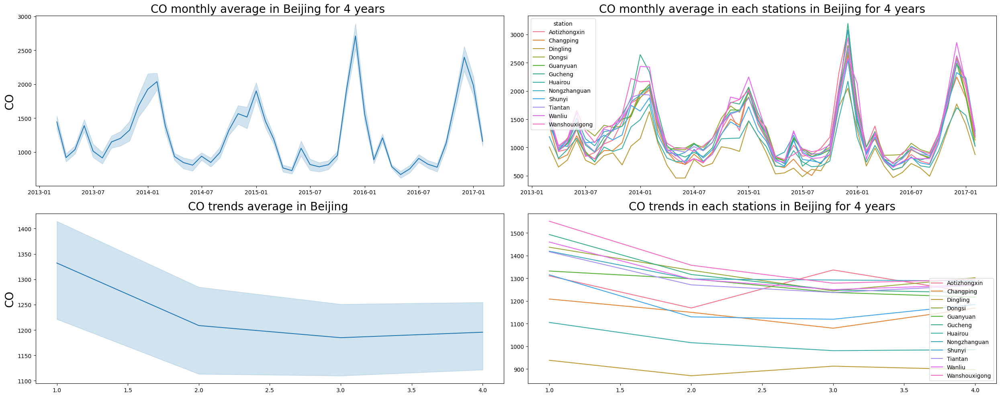

In [354]:
# CO 
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(25, 10))  # Sesuaikan nrows dan ncols dengan jumlah plot
sns.lineplot(x='date', y='CO', data=air_qi_monthly_ey, ax=axes[0,0])
axes[0,0].set_title('CO monthly average in Beijing for 4 years ', size=20)
axes[0,0].set_xlabel('')
axes[0,0].set_ylabel("CO", size=20)

sns.lineplot(x='date', y='CO', data=air_qi_monthly_ey, hue='station', legend='auto', ax=axes[0,1])
axes[0,1].set_title('CO monthly average in each stations in Beijing for 4 years', size=20)
axes[0,1].set_xlabel('')
axes[0,1].set_ylabel('')

sns.lineplot(x='yearly', y='CO', data=air_qi_yearly, ax=axes[1,0])
axes[1,0].set_title('CO trends average in Beijing ', size=20)
axes[1,0].set_xlabel('')
axes[1,0].set_ylabel("CO", size=20)

sns.lineplot(x='yearly', y='CO', data=air_qi_yearly, hue='station', legend='auto', ax=axes[1,1])
axes[1,1].set_title('CO trends in each stations in Beijing for 4 years', size=20)
axes[1,1].set_xlabel('')
axes[1,1].set_ylabel('')

plt.legend(loc='lower right')
plt.tight_layout() 
plt.show()

CO concentrations in Beijing have shown a decreasing trend since 2013.

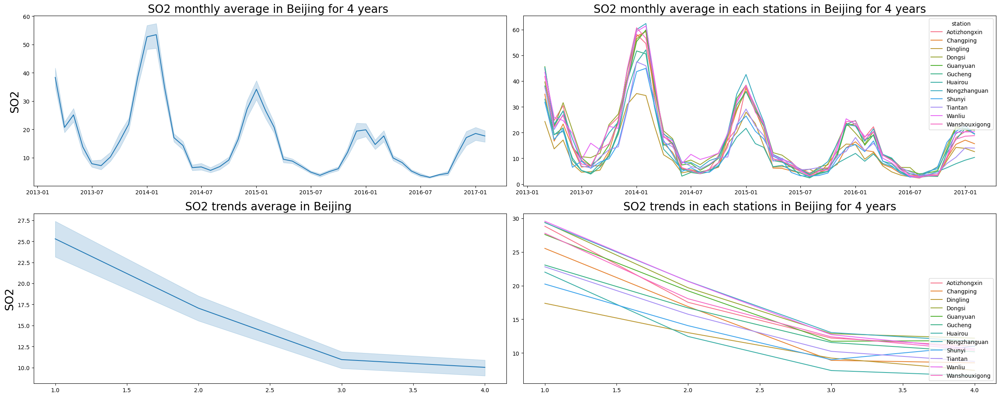

In [355]:
# SO2 
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(25, 10))  # Sesuaikan nrows dan ncols dengan jumlah plot
sns.lineplot(x='date', y='SO2', data=air_qi_monthly_ey, ax=axes[0,0])
axes[0,0].set_title('SO2 monthly average in Beijing for 4 years ', size=20)
axes[0,0].set_xlabel('')
axes[0,0].set_ylabel("SO2", size=20)

sns.lineplot(x='date', y='SO2', data=air_qi_monthly_ey, hue='station', legend='auto', ax=axes[0,1])
axes[0,1].set_title('SO2 monthly average in each stations in Beijing for 4 years', size=20)
axes[0,1].set_xlabel('')
axes[0,1].set_ylabel('')

sns.lineplot(x='yearly', y='SO2', data=air_qi_yearly, ax=axes[1,0])
axes[1,0].set_title('SO2 trends average in Beijing ', size=20)
axes[1,0].set_xlabel('')
axes[1,0].set_ylabel("SO2", size=20)

sns.lineplot(x='yearly', y='SO2', data=air_qi_yearly, hue='station', legend='auto', ax=axes[1,1])
axes[1,1].set_title('SO2 trends in each stations in Beijing for 4 years', size=20)
axes[1,1].set_xlabel('')
axes[1,1].set_ylabel('')

plt.legend(loc='lower right')
plt.tight_layout() 
plt.show()

SO2 concentrations in Beijing have shown a decreasing trend since 2013.

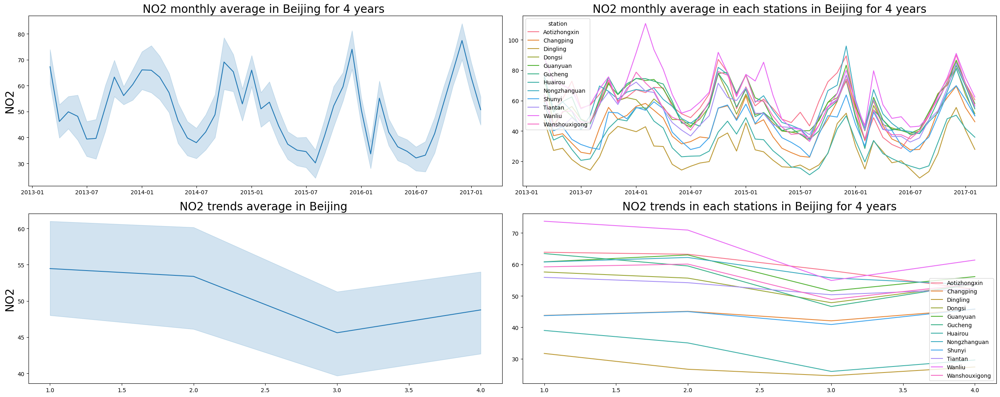

In [356]:
# NO2 
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(25, 10))  # Sesuaikan nrows dan ncols dengan jumlah plot
sns.lineplot(x='date', y='NO2', data=air_qi_monthly_ey, ax=axes[0,0])
axes[0,0].set_title('NO2 monthly average in Beijing for 4 years ', size=20)
axes[0,0].set_xlabel('')
axes[0,0].set_ylabel("NO2", size=20)

sns.lineplot(x='date', y='NO2', data=air_qi_monthly_ey, hue='station', legend='auto', ax=axes[0,1])
axes[0,1].set_title('NO2 monthly average in each stations in Beijing for 4 years', size=20)
axes[0,1].set_xlabel('')
axes[0,1].set_ylabel('')

sns.lineplot(x='yearly', y='NO2', data=air_qi_yearly, ax=axes[1,0])
axes[1,0].set_title('NO2 trends average in Beijing ', size=20)
axes[1,0].set_xlabel('')
axes[1,0].set_ylabel("NO2", size=20)

sns.lineplot(x='yearly', y='NO2', data=air_qi_yearly, hue='station', legend='auto', ax=axes[1,1])
axes[1,1].set_title('NO2 trends in each stations in Beijing for 4 years', size=20)
axes[1,1].set_xlabel('')
axes[1,1].set_ylabel('')

plt.legend(loc='lower right')
plt.tight_layout() 
plt.show()

In general, NO2 concentrations have a fluctuative trend year on year.

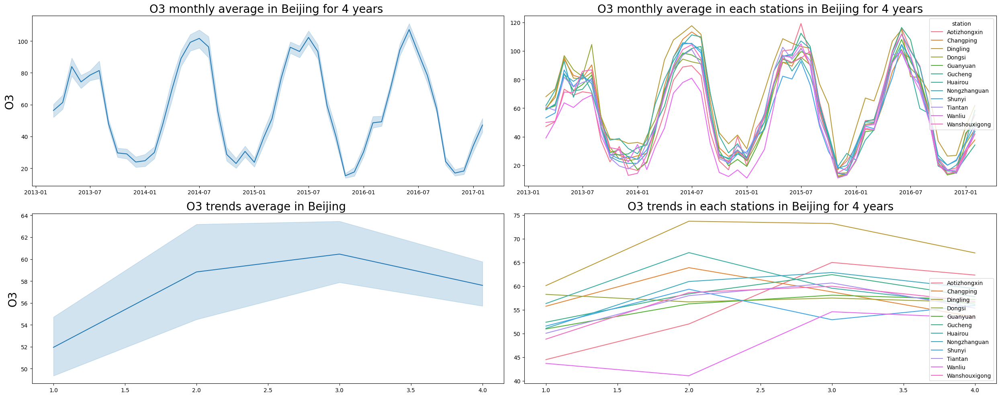

In [357]:
# O3 
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(25, 10))  # Sesuaikan nrows dan ncols dengan jumlah plot
sns.lineplot(x='date', y='O3', data=air_qi_monthly_ey, ax=axes[0,0])
axes[0,0].set_title('O3 monthly average in Beijing for 4 years ', size=20)
axes[0,0].set_xlabel('')
axes[0,0].set_ylabel("O3", size=20)

sns.lineplot(x='date', y='O3', data=air_qi_monthly_ey, hue='station', legend='auto', ax=axes[0,1])
axes[0,1].set_title('O3 monthly average in each stations in Beijing for 4 years', size=20)
axes[0,1].set_xlabel('')
axes[0,1].set_ylabel('')

sns.lineplot(x='yearly', y='O3', data=air_qi_yearly, ax=axes[1,0])
axes[1,0].set_title('O3 trends average in Beijing ', size=20)
axes[1,0].set_xlabel('')
axes[1,0].set_ylabel("O3", size=20)

sns.lineplot(x='yearly', y='O3', data=air_qi_yearly, hue='station', legend='auto', ax=axes[1,1])
axes[1,1].set_title('O3 trends in each stations in Beijing for 4 years', size=20)
axes[1,1].set_xlabel('')
axes[1,1].set_ylabel('')

plt.legend(loc='lower right')
plt.tight_layout() 
plt.show()

On the other hand, Ozone shows an increasing trend since 2013 in Beijing City.

### Where are the areas with the highest and lowest levels of air pollution?


In [429]:
air_qi_sta = air_qi.groupby(['station']).agg({
    'PM2_5' : 'mean',
    'PM10' : 'mean',
    'SO2' : 'mean',
    'NO2' : 'mean',
    'CO' : 'mean',
    'O3' : 'mean',
    'TEMP' : 'mean',
    'PRES' : 'mean',
    'DEWP' : 'mean',
    'RAIN' : 'sum',
    'WSPM' : 'mean',
    'wd' : statistics.mode,
})
air_qi_sta.reset_index(inplace=True)
air_qi_sta.head()

,station,PM2_5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,WSPM,wd
0,Aotizhongxin,82.752368,110.035551,17.381271,59.288253,1262.653720,55.954081,13.584365,1011.846913,3.123116,2362.7,1.708433,NE
1,Changping,71.107299,94.666219,14.960138,44.167974,1151.904136,57.968299,13.687147,1007.760170,1.505409,2113.6,1.853974,NNW
2,Dingling,66.004760,83.759115,11.760308,27.590774,904.947385,68.512701,13.687147,1007.760170,1.505409,2113.6,1.853974,NNW
3,Dongsi,86.163758,110.315206,18.532531,53.674585,1329.494570,57.241717,13.671269,1012.547407,2.447583,2243.5,1.860723,ENE
4,Guanyuan,82.913939,109.003124,17.596148,57.877696,1270.926319,55.611424,13.584365,1011.846913,3.123116,2362.7,1.708433,NE


<BarContainer object of 12 artists>

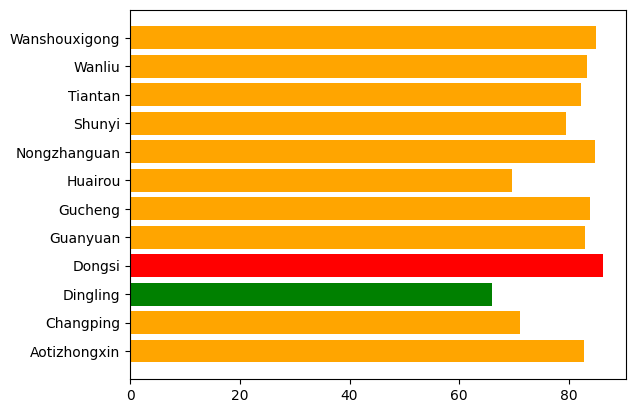

In [ ]:
categories = air_qi_sta['station']
data = air_qi_sta['PM2_5']

max_value = max(data)
min_value = min(data)
colors = []
for value in data:
    if value == max_value:
        colors.append('red')
    elif value == min_value:
        colors.append('green')
    else:
        colors.append('orange')
plt.barh(categories, data, color=colors)
plt.title('Concentration of PM2.5')

Text(0.5, 1.0, 'PM10')

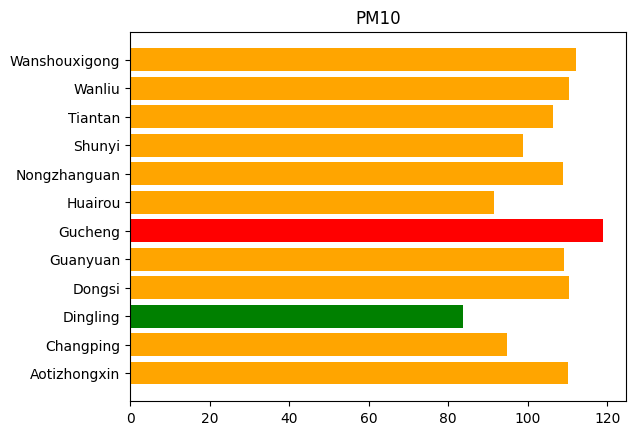

In [431]:
categories = air_qi_sta['station']
data = air_qi_sta['PM10']

max_value = max(data)
min_value = min(data)
colors = []
for value in data:
    if value == max_value:
        colors.append('red')
    elif value == min_value:
        colors.append('green')
    else:
        colors.append('orange')
plt.barh(categories, data, color=colors)
plt.title('Concentration of PM10')

Text(0.5, 1.0, 'CO')

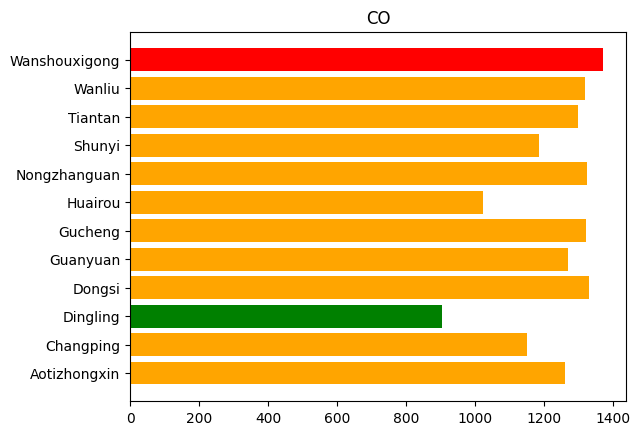

In [433]:
categories = air_qi_sta['station']
data = air_qi_sta['CO']

max_value = max(data)
min_value = min(data)
colors = []
for value in data:
    if value == max_value:
        colors.append('red')
    elif value == min_value:
        colors.append('green')
    else:
        colors.append('orange')
plt.barh(categories, data, color=colors)
plt.title('Concentration of CO')

<BarContainer object of 12 artists>

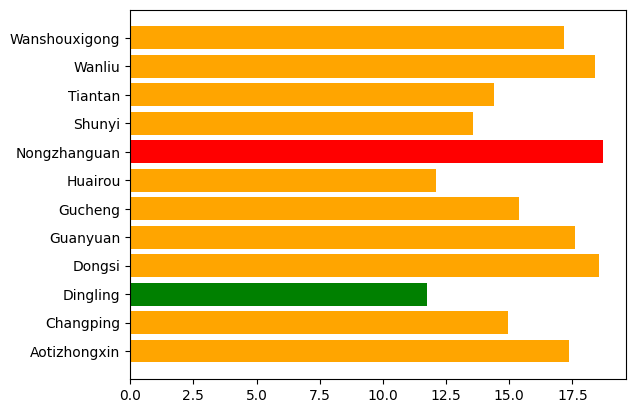

In [ ]:
categories = air_qi_sta['station']
data = air_qi_sta['SO2']

max_value = max(data)
min_value = min(data)
colors = []
for value in data:
    if value == max_value:
        colors.append('red')
    elif value == min_value:
        colors.append('green')
    else:
        colors.append('orange')
plt.barh(categories, data, color=colors)
plt.title('Concentration of SO2')

<BarContainer object of 12 artists>

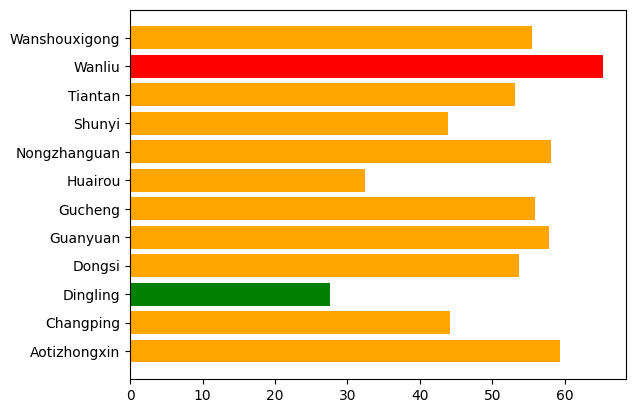

In [ ]:
categories = air_qi_sta['station']
data = air_qi_sta['NO2']

max_value = max(data)
min_value = min(data)
colors = []
for value in data:
    if value == max_value:
        colors.append('red')
    elif value == min_value:
        colors.append('green')
    else:
        colors.append('orange')
plt.barh(categories, data, color=colors)
plt.title('Concentration of NO2')

Text(0.5, 1.0, 'O3')

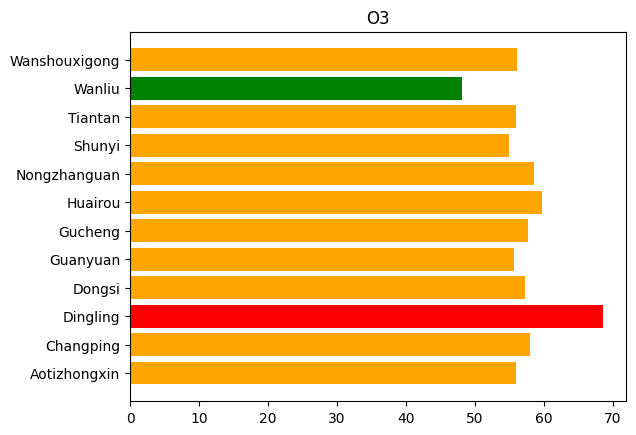

In [432]:
categories = air_qi_sta['station']
data = air_qi_sta['O3']

max_value = max(data)
min_value = min(data)
colors = []
for value in data:
    if value == max_value:
        colors.append('red')
    elif value == min_value:
        colors.append('green')
    else:
        colors.append('orange')
plt.barh(categories, data, color=colors)
plt.title('Concentration of O3')

### How is rainfall related to pollution levels in each region?

Text(0.5, 1.0, 'Correlation with Rain')

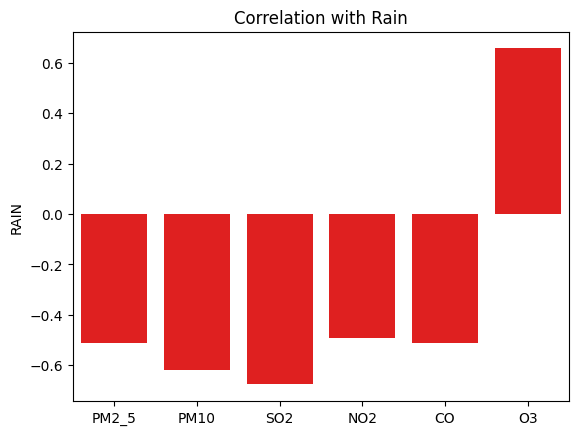

In [439]:
sns.barplot(correlRainQI, color='red')
plt.title('Correlation with Rain')

We can see that rainfall can reduce the concentration of gases and particulate molecules, but not ozone.

## Conclusion

- What are the climate characteristics of Beijing City?

The climate characteristics of Beijing City are that it has a four-season climate type: spring, summer, autumn and winter.

- When is the seasonal pattern of pollutant levels in Beijing?

SO2, NO2, and CO show a seasonal pattern with the lowest concentrations in winter, while PM2.5, PM10, and Ozone show their lowest concentrations in summer.

- How have pollutant levels trended over the last 4 years?

In general, PM2.5 had a decreasing trend, but then increased again in 2017. PM10 and NO2 showed fluctuating trends year on year. CO and SO2 show a decreasing trend, while O3 shows an increasing trend throughout the observation year.

- Where are the areas with the highest and lowest levels of air pollution?

In general, the concentration of pollutant gases and particulate materials at each location has different characteristics. However, the Dingling Observation Station recorded the lowest average values for all pollutant gases and particulate matter, except ozone. In fact, the highest ozone concentration occurred at the Dingling Observation Station.

- How is rainfall related to pollution levels in each region?

Rainfall can reduce the concentration of pollutant gases and particulate matter, but it cannot reduce ozone, but instead increases it.